In [17]:
# used to supress display of warnings
import warnings

# os is used to provide a way of using operating system dependent functionality
# We use it for setting working folder
import os

# Pandas is used for data manipulation and analysis
import pandas as pd 

# Numpy is used for large, multi-dimensional arrays and matrices, along with mathematical operators on these arrays
import numpy as np

# Matplotlib is a data visualization library for 2D plots of arrays, built on NumPy arrays 
# and designed to work with the broader SciPy stack
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib import pyplot

# Seaborn is based on matplotlib, which aids in drawing attractive and informative statistical graphics.
import seaborn as sns

#VIF
from statsmodels.stats.outliers_influence import variance_inflation_factor


## Scikit-learn features various classification, regression and clustering algorithms
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression
from sklearn import metrics
from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import average_precision_score, confusion_matrix, accuracy_score, classification_report, plot_confusion_matrix
from scipy.stats import zscore
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import precision_recall_fscore_support
from sklearn.naive_bayes import GaussianNB
from sklearn import svm
from sklearn.svm import SVC
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering 
# Cross Validation related
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.metrics import silhouette_samples, silhouette_score

_________________________________________________________________

# AIML Module Project - UNSUPERVISED LEARNING - Project 1

# DOMAIN :- Automobile

_________________________________________________________________


# <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e8;">  Import and warehouse data  

## Task: Import all the given datasets and explore shape and size of each.

In [18]:
#Importing Part 1 Json file
df1 = pd.read_json('Part1 - Car-Attributes.json')
print(df1.head())
print()
print("Size:",df1.shape)

    mpg  cyl   disp   hp    wt   acc  yr  origin
0  18.0    8  307.0  130  3504  12.0  70       1
1  15.0    8  350.0  165  3693  11.5  70       1
2  18.0    8  318.0  150  3436  11.0  70       1
3  16.0    8  304.0  150  3433  12.0  70       1
4  17.0    8  302.0  140  3449  10.5  70       1

Size: (398, 8)


In [19]:
#Importing Part 1 csv file
df2 = pd.read_csv('Part1 - Car name.csv')
print(df2.head())
print()
print("Size:",df2.shape)

                    car_name
0  chevrolet chevelle malibu
1          buick skylark 320
2         plymouth satellite
3              amc rebel sst
4                ford torino

Size: (398, 1)


In [20]:
#Merging all the dataset into one frame
car_df = df1.join(df2,how='outer')
car_df

,mpg,cyl,disp,hp,wt,acc,yr,origin,car_name
0,18.0,8,307.0,130,3504,12.0,70,1,chevrolet chevelle malibu
1,15.0,8,350.0,165,3693,11.5,70,1,buick skylark 320
2,18.0,8,318.0,150,3436,11.0,70,1,plymouth satellite
3,16.0,8,304.0,150,3433,12.0,70,1,amc rebel sst
4,17.0,8,302.0,140,3449,10.5,70,1,ford torino
...,...,...,...,...,...,...,...,...,...
393,27.0,4,140.0,86,2790,15.6,82,1,ford mustang gl
394,44.0,4,97.0,52,2130,24.6,82,2,vw pickup
395,32.0,4,135.0,84,2295,11.6,82,1,dodge rampage
396,28.0,4,120.0,79,2625,18.6,82,1,ford ranger


In [21]:
#Exporting to local device 
car_df.to_csv('ExportCarDF_in_CSV.csv',index=False)
car_df.to_excel('ExportCarDF_in_Excel.xlsx',index=False)
car_df.to_json('ExportCarDF_in_json.json',orient='index')


#Now df is exported to local device in every format.
# we can able to fetch the stored data by calling the file name. Lets see how it looks like.

In [22]:
#Importing exported csv file
df = pd.read_csv('ExportCarDF_in_CSV.csv')
print(df.head())
print()
print("> Shape:",df.shape)
print("\n> Size:",df.size)

    mpg  cyl   disp   hp    wt   acc  yr  origin                   car_name
0  18.0    8  307.0  130  3504  12.0  70       1  chevrolet chevelle malibu
1  15.0    8  350.0  165  3693  11.5  70       1          buick skylark 320
2  18.0    8  318.0  150  3436  11.0  70       1         plymouth satellite
3  16.0    8  304.0  150  3433  12.0  70       1              amc rebel sst
4  17.0    8  302.0  140  3449  10.5  70       1                ford torino

> Shape: (398, 9)

> Size: 3582


In [23]:
#Make it into dataframe structure 
df = pd.DataFrame(df)
df

,mpg,cyl,disp,hp,wt,acc,yr,origin,car_name
0,18.0,8,307.0,130,3504,12.0,70,1,chevrolet chevelle malibu
1,15.0,8,350.0,165,3693,11.5,70,1,buick skylark 320
2,18.0,8,318.0,150,3436,11.0,70,1,plymouth satellite
3,16.0,8,304.0,150,3433,12.0,70,1,amc rebel sst
4,17.0,8,302.0,140,3449,10.5,70,1,ford torino
...,...,...,...,...,...,...,...,...,...
393,27.0,4,140.0,86,2790,15.6,82,1,ford mustang gl
394,44.0,4,97.0,52,2130,24.6,82,2,vw pickup
395,32.0,4,135.0,84,2295,11.6,82,1,dodge rampage
396,28.0,4,120.0,79,2625,18.6,82,1,ford ranger


# <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e8;">  Data Cleaning
    
## Task: Missing/incorrect value treatment

In [24]:
# isdigit()? on 'horsepower' 
hpIsDigit = pd.DataFrame(df.hp.str.isdigit())  # if the string is made of digits store True else False

#print isDigit = False!
df[hpIsDigit['hp'] == False]   # from temp take only those rows where hp has false

,mpg,cyl,disp,hp,wt,acc,yr,origin,car_name
32,25.0,4,98.0,?,2046,19.0,71,1,ford pinto
126,21.0,6,200.0,?,2875,17.0,74,1,ford maverick
330,40.9,4,85.0,?,1835,17.3,80,2,renault lecar deluxe
336,23.6,4,140.0,?,2905,14.3,80,1,ford mustang cobra
354,34.5,4,100.0,?,2320,15.8,81,2,renault 18i
374,23.0,4,151.0,?,3035,20.5,82,1,amc concord dl


Out of the 398 rows 6 have ? in the hp column. We could drop those 6 rows - which might not be a good idea under all situations. Here, we will replace them with their median values. First replace '?' with NaN and then replace NaN with median


In [25]:
#Replace ? with NaN
df = df.replace('?', np.nan)
df[hpIsDigit['hp'] == False]

,mpg,cyl,disp,hp,wt,acc,yr,origin,car_name
32,25.0,4,98.0,NaN,2046,19.0,71,1,ford pinto
126,21.0,6,200.0,NaN,2875,17.0,74,1,ford maverick
330,40.9,4,85.0,NaN,1835,17.3,80,2,renault lecar deluxe
336,23.6,4,140.0,NaN,2905,14.3,80,1,ford mustang cobra
354,34.5,4,100.0,NaN,2320,15.8,81,2,renault 18i
374,23.0,4,151.0,NaN,3035,20.5,82,1,amc concord dl


In [26]:
#Replace NaN with median of Hp column
df = df.fillna(df.median())

#re-check the hp colum
#print isDigit = False! #this time no data to be shown. which means all the NaN box is fille with median.

df[hpIsDigit['hp'] == False]   # from df take only those rows where hp has false



,mpg,cyl,disp,hp,wt,acc,yr,origin,car_name
32,25.0,4,98.0,93.5,2046,19.0,71,1,ford pinto
126,21.0,6,200.0,93.5,2875,17.0,74,1,ford maverick
330,40.9,4,85.0,93.5,1835,17.3,80,2,renault lecar deluxe
336,23.6,4,140.0,93.5,2905,14.3,80,1,ford mustang cobra
354,34.5,4,100.0,93.5,2320,15.8,81,2,renault 18i
374,23.0,4,151.0,93.5,3035,20.5,82,1,amc concord dl


In [27]:
df['hp'] = df['hp'].astype('float64')  # converting the hp column from object / string type to float

## Task: Droping the unwanted arritributes

In [28]:
#dropping/ignoring car_name and origin
df = df.drop(['car_name','origin'], axis=1)
df.head()

,mpg,cyl,disp,hp,wt,acc,yr
0,18.0,8,307.0,130.0,3504,12.0,70
1,15.0,8,350.0,165.0,3693,11.5,70
2,18.0,8,318.0,150.0,3436,11.0,70
3,16.0,8,304.0,150.0,3433,12.0,70
4,17.0,8,302.0,140.0,3449,10.5,70


In [29]:
# Original dataframe size
Original_size = df.size

# drop dataframe
df.dropna(inplace=True)

# New dataframe size
New_size=df.size

print("> Original:",Original_size,"vs","New:",New_size)

# Data drop impact analysis

Data_lost=100*((Original_size-New_size)/Original_size)
print("> Percentage of data lost",Data_lost,"%")
if Data_lost<=5:
    print("\n> Not much data has been lost,dropping data was a good option")
else:
    print("\n> Considerable data has been lost,dropping data was not a good option. We need to impute data")

> Original: 2786 vs New: 2786
> Percentage of data lost 0.0 %

> Not much data has been lost,dropping data was a good option


# <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e8;">  Data analysis & visualisation:

In [30]:
#Detailed Statistical analysis
df.describe(include='all').transpose()

,count,mean,std,min,25%,50%,75%,max
mpg,398.0,23.514573,7.815984,9.0,17.500,23.0,29.000,46.6
cyl,398.0,5.454774,1.701004,3.0,4.000,4.0,8.000,8.0
disp,398.0,193.425879,104.269838,68.0,104.250,148.5,262.000,455.0
hp,398.0,104.304020,38.222625,46.0,76.000,93.5,125.000,230.0
wt,398.0,2970.424623,846.841774,1613.0,2223.750,2803.5,3608.000,5140.0
acc,398.0,15.568090,2.757689,8.0,13.825,15.5,17.175,24.8
yr,398.0,76.010050,3.697627,70.0,73.000,76.0,79.000,82.0


In [31]:
df.dtypes 

mpg     float64
cyl       int64
disp    float64
hp      float64
wt        int64
acc     float64
yr        int64
dtype: object

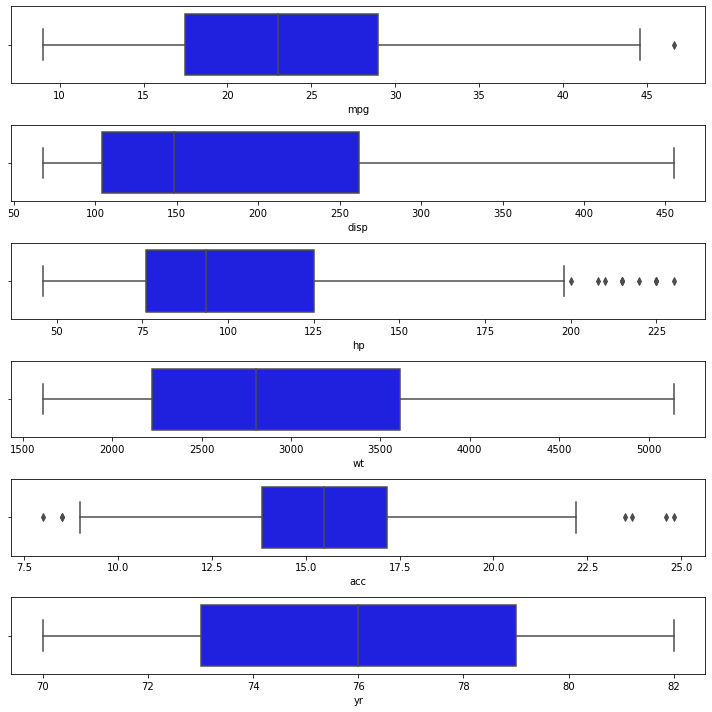

In [32]:
warnings.filterwarnings("ignore")

fig, axxx = plt.subplots(6, 1)
fig.set_figheight(10)
fig.set_figwidth(10)


sns.boxplot(df['mpg'],color='b',ax = axxx[0]);

sns.boxplot(df['disp'],color='b',ax = axxx[1]);

sns.boxplot(df['hp'],color='b',ax = axxx[2]);

sns.boxplot(df['wt'],color='b',ax = axxx[3]);

sns.boxplot(df['acc'],color='b',ax = axxx[4]);

sns.boxplot(df['yr'],color='b',ax = axxx[5]);



fig.tight_layout()

hp and acc have some outliers in the dataset.

In [33]:
import pandas_profiling
pandas_profiling.ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

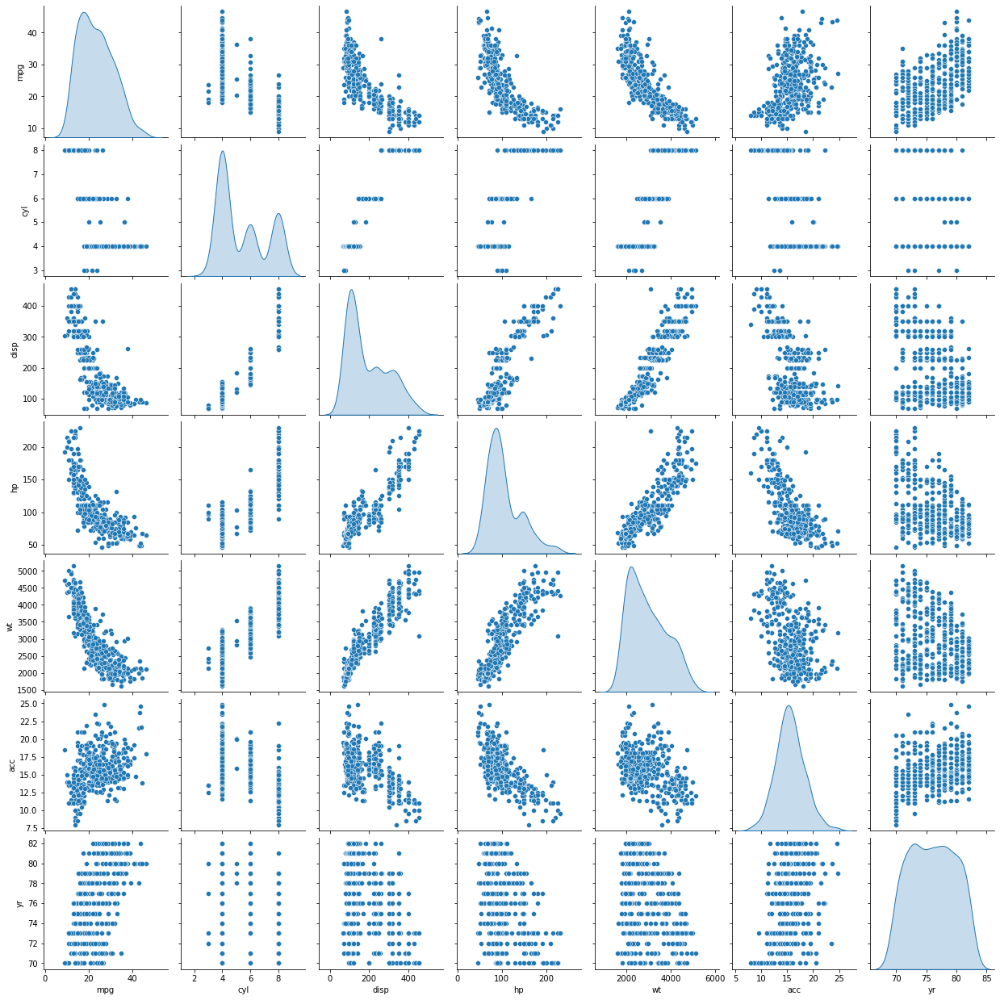

In [34]:
cData_attr = df.iloc[:, 0:7]
sns.pairplot(cData_attr, diag_kind='kde')   # to plot density curve instead of histogram on the diag

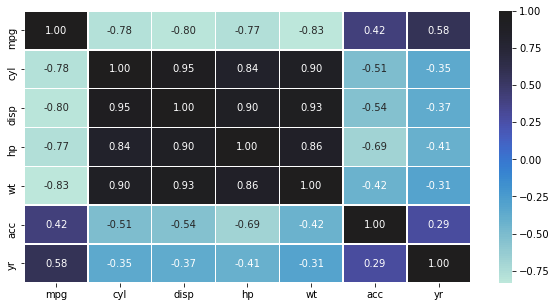

In [35]:
plt.figure(figsize=(10,5))
sns.heatmap(df.corr(), annot=True, linewidths=.5, fmt= '.2f', center = 1 )  # heatmap
plt.show()

### Based on the Corelation - we can able to see CYL is highy co-related with disp,hp & wt
### Also Disp is high positive with hp and wt

### from this we can see high possible multi collinearity availble in this data set. 

In [36]:
# VIF 

def calc_vif(X):

    # Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

    return(vif)

In [37]:
calc_vif(df)

,variables,VIF
0,mpg,51.330411
1,cyl,115.568137
2,disp,87.103433
3,hp,59.118736
4,wt,169.744440
5,acc,68.107958
6,yr,288.604488


## From VIF value we can see high multi collinear is possible and we can able to reduce the dimensionality further.

# Applying PCA

In [38]:
# independant variables
X = df.drop(['mpg'], axis=1)
# the dependent variable
y = df[['mpg']]

In [39]:
XScaled=X.apply(zscore)
XScaled.head()

,cyl,disp,hp,wt,acc,yr
0,1.498191,1.090604,0.673118,0.630870,-1.295498,-1.627426
1,1.498191,1.503514,1.589958,0.854333,-1.477038,-1.627426
2,1.498191,1.196232,1.197027,0.550470,-1.658577,-1.627426
3,1.498191,1.061796,1.197027,0.546923,-1.295498,-1.627426
4,1.498191,1.042591,0.935072,0.565841,-1.840117,-1.627426


In [40]:
covMatrix = np.cov(XScaled,rowvar=False)
print(covMatrix)
pca = PCA(n_components=6)
pca.fit(XScaled)

[[ 1.00251889  0.95311615  0.84340357  0.89827376 -0.50669259 -0.34962425]
 [ 0.95311615  1.00251889  0.89803457  0.93517383 -0.54505356 -0.37109656]
 [ 0.84340357  0.89803457  1.00251889  0.86461476 -0.68831918 -0.41477495]
 [ 0.89827376  0.93517383  0.86461476  1.00251889 -0.41850885 -0.30733654]
 [-0.50669259 -0.54505356 -0.68831918 -0.41850885  1.00251889  0.28886274]
 [-0.34962425 -0.37109656 -0.41477495 -0.30733654  0.28886274  1.00251889]]


PCA(n_components=6)

In [41]:
print("Eigen values")
print(pca.explained_variance_)

print()
print("Eigen vector")
print(pca.components_)
print()
print("% of ratio")
print(pca.explained_variance_ratio_)

Eigen values
[4.26378678 0.84068225 0.67499578 0.13552589 0.06386533 0.03625731]

Eigen vector
[[ 0.45509041  0.46913807  0.46318283  0.44618821 -0.32466834 -0.23188446]
 [ 0.18276349  0.16077095  0.0139189   0.25676595  0.21039209  0.9112425 ]
 [ 0.17104591  0.13443134 -0.12440857  0.27156481  0.86752316 -0.33294164]
 [-0.65709523 -0.18742114  0.62819714  0.33868744  0.15214558  0.02469974]
 [ 0.28804531 -0.00141408  0.60418441 -0.68887559  0.27061128  0.06487726]
 [-0.46420823  0.83717483 -0.10059817 -0.26829299  0.0367486   0.01405118]]

% of ratio
[0.70884563 0.13976166 0.11221664 0.0225309  0.01061748 0.0060277 ]


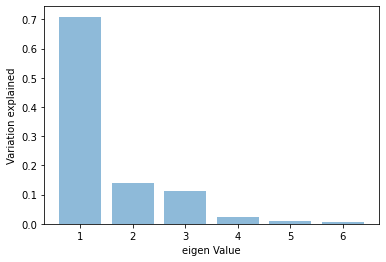

In [42]:
plt.bar(list(range(1,7)),pca.explained_variance_ratio_,alpha=0.5, align='center')
plt.ylabel('Variation explained')
plt.xlabel('eigen Value')
plt.show()

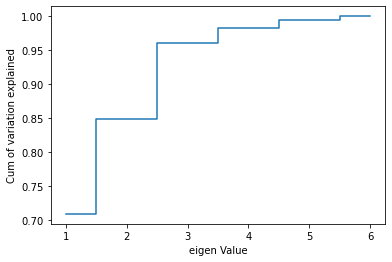

In [43]:
plt.step(list(range(1,7)),np.cumsum(pca.explained_variance_ratio_), where='mid')
plt.ylabel('Cum of variation explained')
plt.xlabel('eigen Value')
plt.show()


# Dimensionality Reduction

Now 3 dimensions seems very reasonable. With 3 variables we can explain over 95% of the variation in the original data!

In [44]:
pca3 = PCA(n_components=3)
pca3.fit(XScaled)
print("Eigen vector")
print(pca3.components_)

print()
print("Eigen values")
print(pca3.explained_variance_)
print()
print("% of Ratio")
print(pca3.explained_variance_ratio_)
print()

Xpca3 = pca3.transform(XScaled)

Eigen vector
[[ 0.45509041  0.46913807  0.46318283  0.44618821 -0.32466834 -0.23188446]
 [ 0.18276349  0.16077095  0.0139189   0.25676595  0.21039209  0.9112425 ]
 [ 0.17104591  0.13443134 -0.12440857  0.27156481  0.86752316 -0.33294164]]

Eigen values
[4.26378678 0.84068225 0.67499578]

% of Ratio
[0.70884563 0.13976166 0.11221664]



In [45]:
c =pd.DataFrame(Xpca3) # Reduced datasets
c

,0,1,2
0,2.584702,-1.135036,-0.091586
1,3.361725,-1.036707,-0.246945
2,2.958928,-1.207794,-0.479378
3,2.776396,-1.153929,-0.183434
4,2.831315,-1.270389,-0.620758
...,...,...,...
393,-1.327528,1.180026,-0.743691
394,-3.342875,1.588379,1.934504
395,-1.163935,0.715747,-2.162482
396,-1.943246,1.325672,0.145263


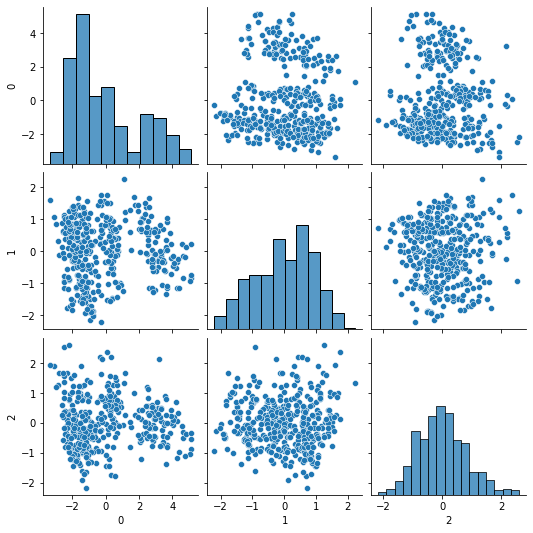

In [46]:
sns.pairplot(pd.DataFrame(Xpca3));

### The above Pair plot shows the reduced data. With 3 feature we can obtain the high postive result from the original dataset 

# <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e8;">  Machine Learning

# K - means Clustering

Text(0.5, 1.0, 'Selecting k with the Elbow Method')

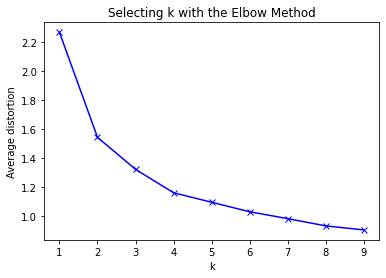

In [47]:
#Finding optimal no. of clusters
from scipy.spatial.distance import cdist
clusters=range(1,10)
meanDistortions=[]

for k in clusters:
    model=KMeans(n_clusters=k)
    model.fit(XScaled)
    prediction=model.predict(XScaled)
    meanDistortions.append(sum(np.min(cdist(XScaled, model.cluster_centers_, 'euclidean'), axis=1)) / XScaled.shape[0])


plt.plot(clusters, meanDistortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Average distortion')
plt.title('Selecting k with the Elbow Method')


## In the elbow graph, we see bend at k=3 and k=5 has cluster formation which has more independent  

In [48]:
# Let us first start with K = 3
final_model=KMeans(3)
final_model.fit(XScaled)
prediction=final_model.predict(XScaled)

#Append the prediction 
df["GROUP"] = prediction
XScaled["GROUP"] = prediction
print("Groups Assigned : \n")
df.head()

Groups Assigned : 



,mpg,cyl,disp,hp,wt,acc,yr,GROUP
0,18.0,8,307.0,130.0,3504,12.0,70,1
1,15.0,8,350.0,165.0,3693,11.5,70,1
2,18.0,8,318.0,150.0,3436,11.0,70,1
3,16.0,8,304.0,150.0,3433,12.0,70,1
4,17.0,8,302.0,140.0,3449,10.5,70,1


### Analyse with box plox by grouping

In [49]:
carClust = XScaled.groupby(['GROUP'])
carClust.mean()

,cyl,disp,hp,wt,acc,yr
GROUP,,,,,,
0,-0.861927,-0.808396,-0.660043,-0.774476,0.356511,0.284826
1,1.498191,1.500684,1.514129,1.400016,-1.076122,-0.672556
2,0.415875,0.292454,-0.056271,0.318693,0.294241,0.043865


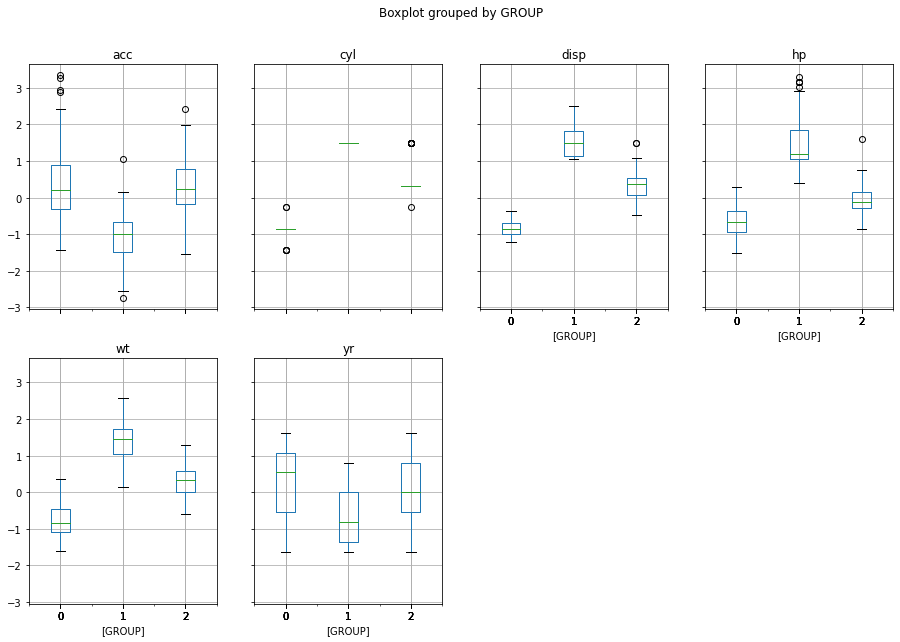

In [50]:
XScaled.boxplot(by='GROUP', layout = (2,4),figsize=(15,10));

## It is seen from the graph that group 1,2 & 3 are not overlapping except in yr column 

Groups Assigned : 



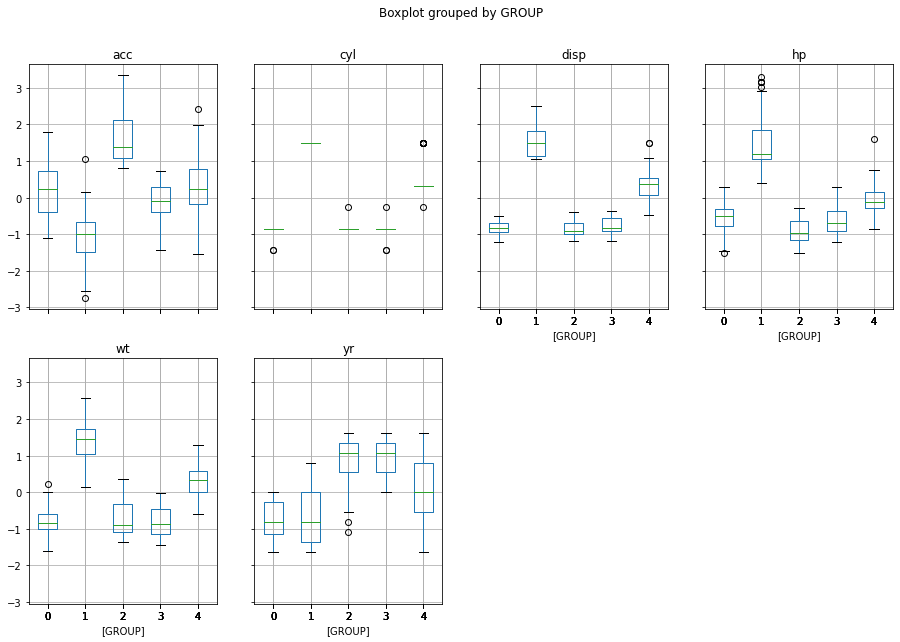

In [51]:
# Let us start with K = 5
final_model=KMeans(5)
final_model.fit(XScaled)
prediction=final_model.predict(XScaled)

#Append the prediction 
df["GROUP"] = prediction
XScaled["GROUP"] = prediction
print("Groups Assigned : \n")
carClust = df.groupby(['GROUP'])
XScaled.boxplot(by='GROUP', layout = (2,4),figsize=(15,10));

# Hierarchical Clustering

In [52]:
Hmodel = AgglomerativeClustering(n_clusters=3, affinity='euclidean',  linkage='average')

In [53]:
Hmodel.fit(XScaled)

AgglomerativeClustering(linkage='average', n_clusters=3)

In [54]:
df['labels'] = Hmodel.labels_
df.head(10)

,mpg,cyl,disp,hp,wt,acc,yr,GROUP,labels
0,18.0,8,307.0,130.0,3504,12.0,70,1,1
1,15.0,8,350.0,165.0,3693,11.5,70,1,1
2,18.0,8,318.0,150.0,3436,11.0,70,1,1
3,16.0,8,304.0,150.0,3433,12.0,70,1,1
4,17.0,8,302.0,140.0,3449,10.5,70,1,1
5,15.0,8,429.0,198.0,4341,10.0,70,1,1
6,14.0,8,454.0,220.0,4354,9.0,70,1,1
7,14.0,8,440.0,215.0,4312,8.5,70,1,1
8,14.0,8,455.0,225.0,4425,10.0,70,1,1
9,15.0,8,390.0,190.0,3850,8.5,70,1,1


In [55]:
a = df.groupby(['labels'])
a.mean()

,mpg,cyl,disp,hp,wt,acc,yr,GROUP
labels,,,,,,,,
0,26.691480,4.901345,158.112108,87.437220,2710.008969,16.557848,78.130045,3.246637
1,14.469474,8.000000,349.705263,162.105263,4154.526316,12.604211,73.526316,1.000000
2,25.400000,3.975000,106.281250,82.681250,2290.212500,16.328750,73.050000,0.000000


In [56]:
from scipy.cluster.hierarchy import cophenet, dendrogram, linkage

In [57]:
from scipy.spatial.distance import pdist  #Pairwise distribution between data points

In [58]:
# cophenet index is a measure of the correlation between the distance of points in feature space and distance on dendrogram
# closer it is to 1, the better is the clustering

Z = linkage(XScaled, metric='euclidean', method='average')
c, coph_dists = cophenet(Z , pdist(XScaled))

c

0.8749925765917995

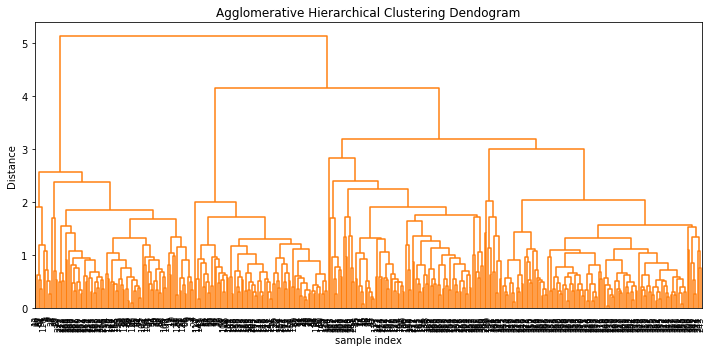

In [59]:
plt.figure(figsize=(10, 5))
plt.title('Agglomerative Hierarchical Clustering Dendogram')
plt.xlabel('sample index')
plt.ylabel('Distance')
dendrogram(Z, leaf_rotation=90.,color_threshold = 40, leaf_font_size=8. )
plt.tight_layout()

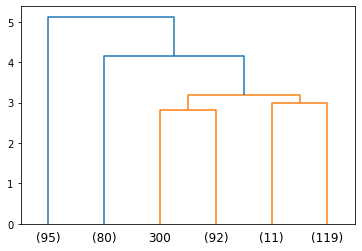

In [60]:
dendrogram(
    Z,
    truncate_mode='lastp',  # show only the last p merged clusters
    p=6,  # show only the last p merged clusters
)
plt.show()

## From K- means clustering and Hierarchical clustering,

#### Hierarchical cluster is not well designed for high data points.
#### On seeing the Groups and Label mean for K=3 , it is more similar 

## Mention how many optimal clusters are present in the data and what could be the possible reason behind it.

#### The data has 3 optimal cluster...
> On seeing pair plot , we can see the max of 3 peaks in the graph. which means there are more data oriented to that 3 areas.

## Use linear regression model on different clusters separately and print the coefficients of the models individually

### lets print the 3 different cluster

In [61]:
#Print the 3 cluster 
C1 = df.loc[df.GROUP == 0]
C2 = df.loc[df.GROUP == 1]
C3 = df.loc[df.GROUP == 2]

In [62]:
# lets build our linear model
# independant variables
C1X = C1.drop(['mpg','GROUP','labels'], axis=1)
# the dependent variable
C1y = C1[['mpg']]

# For Cluster 2

C2X = C2.drop(['mpg','GROUP','labels'], axis=1)
# the dependent variable
C2y = C2[['mpg']]

# For Cluster 3

C3X = C3.drop(['mpg','GROUP','labels'], axis=1)
# the dependent variable
C3y = C3[['mpg']]

In [63]:
# Split X and y into training and test set in 70:30 ratio

X_train, X_test, y_train, y_test = train_test_split(C1X, C1y, test_size=0.30, random_state=1)

#Fit model
regression_model_C1 = LinearRegression()
regression_model_C1.fit(X_train, y_train)

#Co-effeicieent for C1
for idx, col_name in enumerate(X_train.columns):
    print("The coefficient for {} is {}".format(col_name, regression_model_C1.coef_[0][idx]))
    
print()

intercept_C1 = regression_model_C1.intercept_[0]
print("The intercept for C1 model is {}".format(intercept_C1))

The coefficient for cyl is 10.071543971717134
The coefficient for disp is -0.07087562077574656
The coefficient for hp is 0.018615147321492855
The coefficient for wt is -0.006882079856830943
The coefficient for acc is 0.09629808688763043
The coefficient for yr is 0.3672896980028978

The intercept for C1 model is -21.095990172439308


In [70]:
# Split X and y into training and test set in 70:30 ratio for cluster 2

X_train, X_test, y_train, y_test = train_test_split(C2X, C2y, test_size=0.30, random_state=1)

#Fit model
regression_model_C2 = LinearRegression()
regression_model_C2.fit(X_train, y_train)

#Co-effeicieent for C2
for idx, col_name in enumerate(X_train.columns):
    print("The coefficient for {} is {}".format(col_name, regression_model_C2.coef_[0][idx]))
    
print()

intercept_C2 = regression_model_C2.intercept_[0]
print("The intercept for C2 model is {}".format(intercept_C2))



The coefficient for cyl is 0.0
The coefficient for disp is 0.0020676989608468905
The coefficient for hp is -0.032344570443005316
The coefficient for wt is -0.0015389485228742227
The coefficient for acc is -0.4332929853465373
The coefficient for yr is 0.3470315318287905

The intercept for C2 model is 5.413838259256767


In [65]:
# Split X and y into training and test set in 70:30 ratio for cluster 3

X_train, X_test, y_train, y_test = train_test_split(C3X, C3y, test_size=0.30, random_state=1)

#Fit model
regression_model_C3 = LinearRegression()
regression_model_C3.fit(X_train, y_train)

#Co-effeicieent for C3
for idx, col_name in enumerate(X_train.columns):
    print("The coefficient for {} is {}".format(col_name, regression_model_C3.coef_[0][idx]))
    
print()

intercept_C3 = regression_model_C3.intercept_[0]
print("The intercept for C3 model is {}".format(intercept_C3))

The coefficient for cyl is 0.0
The coefficient for disp is -0.10535260505343794
The coefficient for hp is -0.19928481720419364
The coefficient for wt is -0.0026088325999074962
The coefficient for acc is 0.14754416334070292
The coefficient for yr is 1.737202884099878

The intercept for C3 model is -77.65358071376586


### How using different models for different clusters will be helpful in this case and how it will be different than using one single model without clustering? Mention how it impacts performance and prediction.

In [68]:
# Naive Bayes for Cluster 1

C1X = C1.drop(['mpg','GROUP','labels'], axis=1)
# the dependent variable
C1y = C1['mpg']
C1y=C1y.astype('int')
X_train, X_test, y_train, y_test = train_test_split(C1X, C1y, test_size=0.30, random_state=1)

model = GaussianNB()
model.fit(X_train, y_train)

model_score = model.score(X_train, y_train)
y_predict = model.predict(X_train)
print("\nTrain accuracy:",round(100*model_score,2),"%")


model_score = model.score(X_test, y_test)
y_predict = model.predict(X_test)

print("\nTest accuracy:",round(100*model_score,2),"%")


Train accuracy: 58.93 %

Test accuracy: 8.33 %


In [69]:
# for Cluster 2 using Linear regression (model already called in earliear step )
print()
print("Train accuracy",round(100*(regression_model_C2.score(X_train, y_train)),2),"%")

print()
print("Test accuracy",round(100*(regression_model_C2.score(X_test, y_test)),2),"%")



Train accuracy -381.65 %

Test accuracy -524.04 %


In [71]:
# lets build our linear model on original dataset without clustring
# independant variables
X = df.drop(['mpg','GROUP','labels'], axis=1)
# the dependent variable
y = df[['mpg']]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=1)

regression_model = LinearRegression()
regression_model.fit(X_train, y_train)

for idx, col_name in enumerate(X_train.columns):
    print("The coefficient for {} is {}".format(col_name, regression_model.coef_[0][idx]))
    

intercept = regression_model.intercept_[0]
print()
print("The intercept for our model is {}".format(intercept))

print()
print("Insample Score",round(100*(regression_model.score(X_train, y_train)),2),"%")

print()
print("Outsample Score",round(100*(regression_model.score(X_test, y_test)),2),"%")


The coefficient for cyl is -0.18095805032306134
The coefficient for disp is 0.010983679987754645
The coefficient for hp is -0.00898274748809656
The coefficient for wt is -0.007188190332770612
The coefficient for acc is 0.02914290133876269
The coefficient for yr is 0.7883566858707713

The intercept for our model is -15.621707993406599

Insample Score 79.97 %

Outsample Score 82.68 %


>On doing different models for different cluster, we can see the difference in accuracy score. So in this case, it will help to increase the model prediction and model accuracy between the cluster.

>On doing single model on original data without clustering, we can able to see the more accuracy score than clustered model.

_________________________________________________________________

# AIML Module Project - UNSUPERVISED LEARNING - Project 2

# DOMAIN :- Manufacturing 

_________________________________________________________________


In [72]:
dfw = pd.DataFrame(pd.read_excel('Part2 - Company.xlsx'))

dfw.head() #sample dataset


,A,B,C,D,Quality
0,47,27,45,108,Quality A
1,174,133,134,166,Quality B
2,159,163,135,131,NaN
3,61,23,3,44,Quality A
4,59,60,9,68,Quality A


In [59]:
#Shape and Size of dataset
print("> Shape:",dfw.shape)
print("\n> Size:",dfw.size)


> Shape: (61, 5)

> Size: 305


In [60]:
# Findingvalued total Missing value 
dfw.isna().sum()

A           0
B           0
C           0
D           0
Quality    18
dtype: int64

In [61]:
dfw.dtypes

A           int64
B           int64
C           int64
D           int64
Quality    object
dtype: object

In [62]:
df1= pd.DataFrame(dfw.copy())
df1.head()

,A,B,C,D,Quality
0,47,27,45,108,Quality A
1,174,133,134,166,Quality B
2,159,163,135,131,NaN
3,61,23,3,44,Quality A
4,59,60,9,68,Quality A


In [63]:
df1['Quality'].unique()

array(['Quality A', 'Quality B', nan], dtype=object)

In [64]:
#Now lets drop the Quality feature and do the clustring to find the missing quality as A or B in the place of NaN

df2= df1.drop(['Quality'], axis=1)
df2

,A,B,C,D
0,47,27,45,108
1,174,133,134,166
2,159,163,135,131
3,61,23,3,44
4,59,60,9,68
...,...,...,...,...
56,200,186,185,179
57,137,182,165,199
58,88,39,9,102
59,180,157,192,198


In [65]:
ScaledWine = df2.apply(zscore)
ScaledWine.head()

,A,B,C,D
0,-1.168034,-1.561080,-1.061569,-0.103138
1,0.904992,0.284923,0.306077,0.823013
2,0.660147,0.807376,0.321443,0.264129
3,-0.939512,-1.630740,-1.706975,-1.125099
4,-0.972158,-0.986381,-1.614775,-0.741864


Text(0.5, 1.0, 'Selecting k with the Elbow Method')

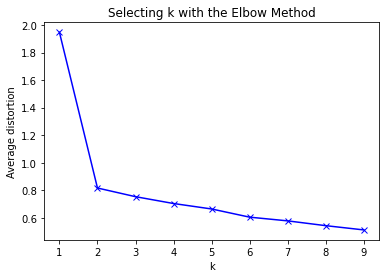

In [66]:
#Finding optimal no. of clusters

clusters=range(1,10)
meanDistortions=[]

for k in clusters:
    model=KMeans(n_clusters=k)
    model.fit(ScaledWine)
    prediction=model.predict(ScaledWine)
    meanDistortions.append(sum(np.min(cdist(ScaledWine, model.cluster_centers_, 'euclidean'), axis=1)) / ScaledWine.shape[0])


plt.plot(clusters, meanDistortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Average distortion')
plt.title('Selecting k with the Elbow Method')

> As we know from the dataset has only 2 target variables i.e Quality A and Quality B. Also in graph we see the elbow point at 2.

In [67]:
#Choosing K = 2 for clustring

final_model=KMeans(2)
final_model.fit(ScaledWine)
prediction=final_model.predict(ScaledWine)

#Append the prediction 
df2["GROUP"] = prediction
ScaledWine["GROUP"] = prediction
print("Groups Assigned : \n")
df2.head()


Groups Assigned : 



,A,B,C,D,GROUP
0,47,27,45,108,1
1,174,133,134,166,0
2,159,163,135,131,0
3,61,23,3,44,1
4,59,60,9,68,1


In [68]:
#Seperate the Goup column alone
PredGroup = df2['GROUP']

## While comparing visually, we see 0 refers to Quality A and 1 refers to Quality B

In [69]:
#Join the Group column to original dataset and see the patterns
Compare = df1.join(PredGroup)
Compare.head(25)

,A,B,C,D,Quality,GROUP
0,47,27,45,108,Quality A,1
1,174,133,134,166,Quality B,0
2,159,163,135,131,NaN,0
3,61,23,3,44,Quality A,1
4,59,60,9,68,Quality A,1
5,153,140,154,199,NaN,0
6,34,28,78,22,Quality A,1
7,191,144,143,154,NaN,0
8,160,181,194,178,Quality B,0
9,145,178,158,141,NaN,0


> From the sample of 25 datapoint, cluster group follow follows same patterns as like origanal datapoint (i.e.,) Qualilty A = 1 and Quality B = 0

In [70]:
Compare.rename(columns={'GROUP':'Quality_Modified'},inplace=True)
Compare.drop(['Quality'], axis=1,inplace=True)


In [71]:
FinalSubmission = Compare.replace({1:'Quality A',0:'Quality B'})

In [72]:
FinalSubmission

,A,B,C,D,Quality_Modified
0,47,27,45,108,Quality A
1,174,133,134,166,Quality B
2,159,163,135,131,Quality B
3,61,23,3,44,Quality A
4,59,60,9,68,Quality A
...,...,...,...,...,...
56,200,186,185,179,Quality B
57,137,182,165,199,Quality B
58,88,39,9,102,Quality A
59,180,157,192,198,Quality B


In [73]:
FinalSubmission.to_excel('Part2-FinalModifiedDataset.xlsx',index=False)

_________________________________________________________________

# AIML Module Project - UNSUPERVISED LEARNING - Project 3

# DOMAIN :- Automobile

_________________________________________________________________


## Data import, Clean &  Pre-processing

In [74]:
veh = pd.read_csv('Part3 - vehicle.csv')
veh.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,bus


In [75]:
#Shape and Size of dataset
print("> Shape:",veh.shape)
print("\n> Size:",veh.size)


> Shape: (846, 19)

> Size: 16074


In [76]:
veh.isna().sum()

compactness                    0
circularity                    5
distance_circularity           4
radius_ratio                   6
pr.axis_aspect_ratio           2
max.length_aspect_ratio        0
scatter_ratio                  1
elongatedness                  1
pr.axis_rectangularity         3
max.length_rectangularity      0
scaled_variance                3
scaled_variance.1              2
scaled_radius_of_gyration      2
scaled_radius_of_gyration.1    4
skewness_about                 6
skewness_about.1               1
skewness_about.2               1
hollows_ratio                  0
class                          0
dtype: int64

In [84]:
# Original dataframe size
Original_size = veh.size

# drop dataframe
veh.dropna(inplace=True)

# New dataframe size
New_size=veh.size

print("> Original:",Original_size,"vs","New:",New_size)

# Data drop impact analysis

Data_lost=100*((Original_size-New_size)/Original_size)
print("> Percentage of data lost",Data_lost,"%")
if Data_lost<=5:
    print("\n> Not much data has been lost,dropping data was a good option")
else:
    print("\n> Considerable data has been lost,dropping data was not a good option. We need to impute data")

> Original: 16074 vs New: 15447
> Percentage of data lost 3.900709219858156 %

> Not much data has been lost,dropping data was a good option


## EDA

In [85]:
veh.describe(include='all')

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
count,813.000000,813.000000,813.00000,813.000000,813.000000,813.000000,813.000000,813.00000,813.000000,813.000000,813.000000,813.000000,813.000000,813.000000,813.000000,813.000000,813.000000,813.000000,813
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,car
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,413
mean,93.656827,44.803198,82.04305,169.098401,61.774908,8.599016,168.563346,40.98893,20.558426,147.891759,188.377614,438.382534,174.252153,72.399754,6.351784,12.687577,188.979090,195.729397,NaN
std,8.233751,6.146659,15.78307,33.615402,7.973000,4.677174,33.082186,7.80338,2.573184,14.504648,31.165873,175.270368,32.332161,7.475994,4.921476,8.926951,6.153681,7.398781,NaN
min,73.000000,33.000000,40.00000,104.000000,47.000000,2.000000,112.000000,26.00000,17.000000,118.000000,130.000000,184.000000,109.000000,59.000000,0.000000,0.000000,176.000000,181.000000,NaN
25%,87.000000,40.000000,70.00000,141.000000,57.000000,7.000000,146.000000,33.00000,19.000000,137.000000,167.000000,318.000000,149.000000,67.000000,2.000000,6.000000,184.000000,191.000000,NaN
50%,93.000000,44.000000,79.00000,167.000000,61.000000,8.000000,157.000000,43.00000,20.000000,146.000000,179.000000,364.000000,173.000000,71.000000,6.000000,11.000000,189.000000,197.000000,NaN
75%,100.000000,49.000000,98.00000,195.000000,65.000000,10.000000,198.000000,46.00000,23.000000,159.000000,217.000000,586.000000,198.000000,75.000000,9.000000,19.000000,193.000000,201.000000,NaN


In [86]:
veh.dtypes

compactness                      int64
circularity                    float64
distance_circularity           float64
radius_ratio                   float64
pr.axis_aspect_ratio           float64
max.length_aspect_ratio          int64
scatter_ratio                  float64
elongatedness                  float64
pr.axis_rectangularity         float64
max.length_rectangularity        int64
scaled_variance                float64
scaled_variance.1              float64
scaled_radius_of_gyration      float64
scaled_radius_of_gyration.1    float64
skewness_about                 float64
skewness_about.1               float64
skewness_about.2               float64
hollows_ratio                    int64
class                           object
dtype: object

In [87]:
veh['class'].value_counts()

car    413
bus    205
van    195
Name: class, dtype: int64

> car are double in number as compare to bus and van

In [88]:
# label encoding the target variable
le = LabelEncoder()
veh['class']=le.fit_transform(veh['class'])
veh['class'].value_counts()

1    413
0    205
2    195
Name: class, dtype: int64

<AxesSubplot:xlabel='class', ylabel='count'>

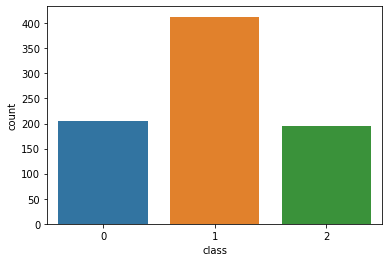

In [89]:
sns.countplot(veh['class'])

### Implies --> 0 as Bus, 1 as car, 2 as van

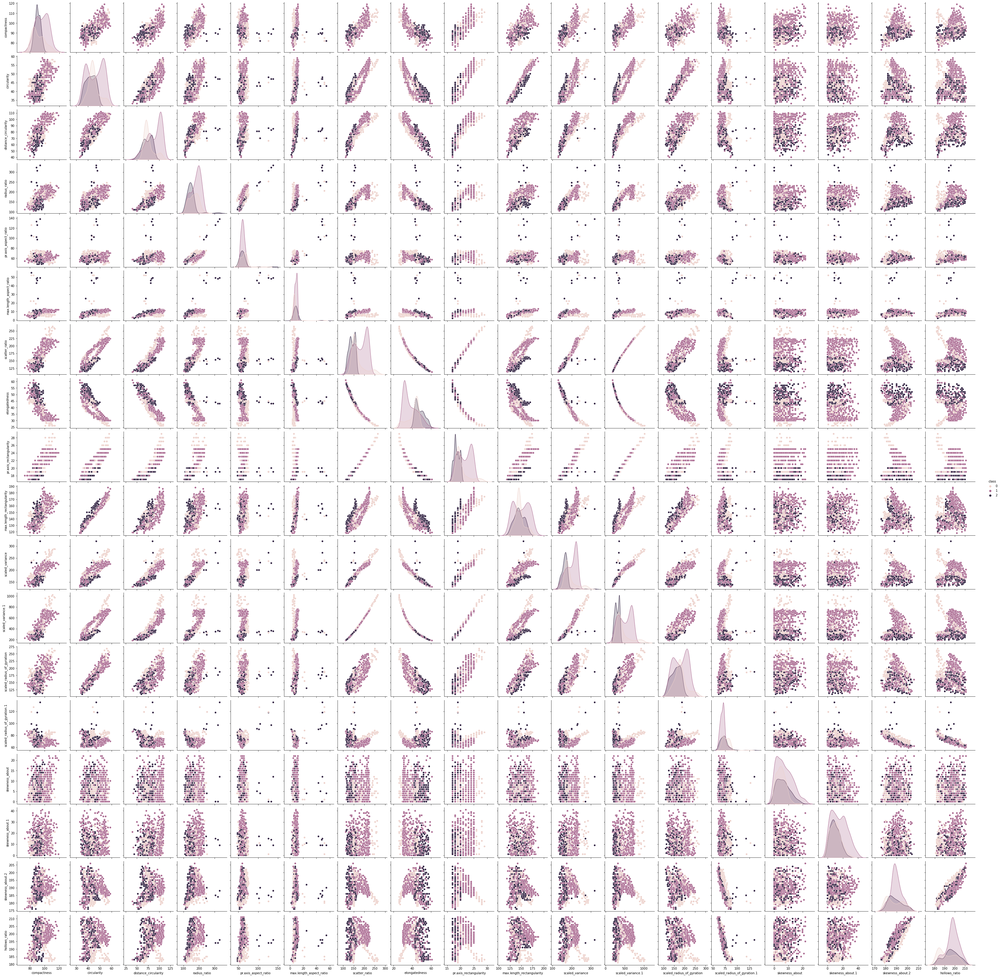

In [90]:
sns.pairplot(veh,diag_kind='kde',hue='class')

>  1. Many features show high correlation indicating that we need to drop multiple features- we will use PCA for the same
>  2. Spread of compactness is least for van. mean compactness is highest for car. For Bus compactness is right skewed indicating that less number of buses have high compactness.
>  3.distribution of max.length_rectangularity is almost same for cars, bus and vans
>  4.Mean scaled variance is highest for cars followed by bus then vans

In [97]:
corr =veh.corr()
corr

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
compactness,1.000000,0.689885,0.789955,0.688130,0.090557,0.150369,0.814026,-0.788051,0.814227,0.674902,0.764386,0.820240,0.581405,-0.258437,0.231648,0.168384,0.296195,0.372806,-0.037391
circularity,0.689885,1.000000,0.797704,0.623950,0.155023,0.251619,0.858149,-0.825108,0.856137,0.965366,0.806108,0.850932,0.935594,0.049070,0.141726,-0.001975,-0.113902,0.049331,-0.161018
distance_circularity,0.789955,0.797704,1.000000,0.771404,0.163386,0.265591,0.909023,-0.912713,0.897261,0.773459,0.865683,0.891789,0.705689,-0.238145,0.110280,0.277851,0.145258,0.343228,-0.067445
radius_ratio,0.688130,0.623950,0.771404,1.000000,0.667375,0.452460,0.743470,-0.795761,0.716210,0.570478,0.806788,0.731773,0.544636,-0.175348,0.044693,0.178079,0.375591,0.470895,-0.199219
pr.axis_aspect_ratio,0.090557,0.155023,0.163386,0.667375,1.000000,0.652093,0.113696,-0.191193,0.086992,0.133553,0.290375,0.100668,0.135663,0.173060,-0.059244,-0.040769,0.229702,0.257566,-0.114292
max.length_aspect_ratio,0.150369,0.251619,0.265591,0.452460,0.652093,1.000000,0.171445,-0.183242,0.167514,0.309180,0.331124,0.150069,0.197179,0.308329,0.016461,0.041210,-0.030543,0.139283,0.202235
scatter_ratio,0.814026,0.858149,0.909023,0.743470,0.113696,0.171445,1.000000,-0.973413,0.991992,0.808154,0.950067,0.996396,0.795748,-0.045632,0.070118,0.227375,0.009967,0.138424,-0.287590
elongatedness,-0.788051,-0.825108,-0.912713,-0.795761,-0.191193,-0.183242,-0.973413,1.000000,-0.950345,-0.771099,-0.937846,-0.956858,-0.761563,0.119750,-0.046621,-0.201325,-0.117568,-0.233408,0.342712
pr.axis_rectangularity,0.814227,0.856137,0.897261,0.716210,0.086992,0.167514,0.991992,-0.950345,1.000000,0.811979,0.935653,0.992119,0.792895,-0.033769,0.078701,0.231171,-0.017383,0.117202,-0.255354
max.length_rectangularity,0.674902,0.965366,0.773459,0.570478,0.133553,0.309180,0.808154,-0.771099,0.811979,1.000000,0.744760,0.796230,0.865240,0.031098,0.130356,0.013045,-0.108019,0.086792,-0.025539


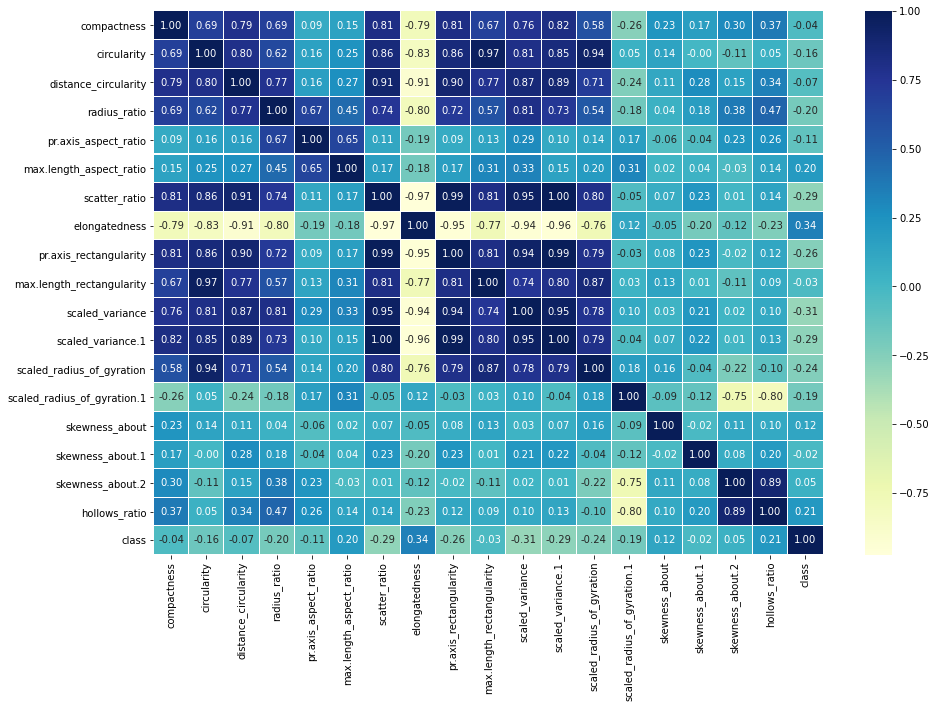

In [96]:
fig,ax = plt.subplots(figsize=(15, 10))   
sns.heatmap(corr, ax=ax, annot=True, linewidths=0.05, fmt= '.2f',cmap="YlGnBu") 
plt.show()

From above correlation matrix we can see that there are many features which are highly correlated. if we see carefully then scaled_variance.1 and scatter_ratio has correlation of 1 and many other features are also there which having more than 0.9(positive or negative) correlation e.g sekweness_about2 and hollows_ratio, scaled variance & scaled_variance1, elongatedness & scaled variance, elongatedness & scaled variance1 etc.

There are lot of dimensions with correlation above +- 0.7 and it is difficult to determine which dimensions to drop manually. We will use PCA to determine it.

Text(0.5, 1.0, 'Box Plot')

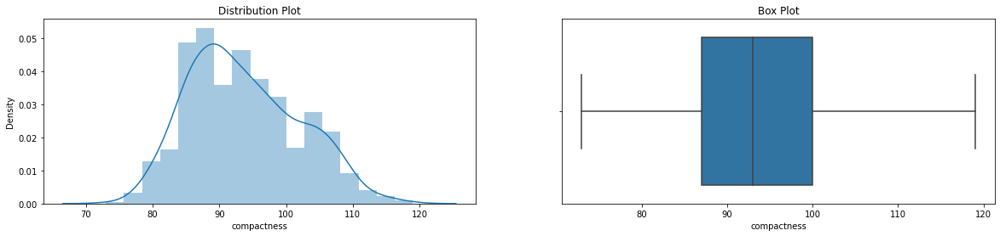

In [98]:
fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(20,4)
sns.distplot(veh['compactness'],ax=ax1)
ax1.set_title("Distribution Plot")

sns.boxplot(veh['compactness'],ax=ax2)
ax2.set_title("Box Plot")

> Compactness Distribution has right skewed and has no outliers

Text(0.5, 1.0, 'Box Plot')

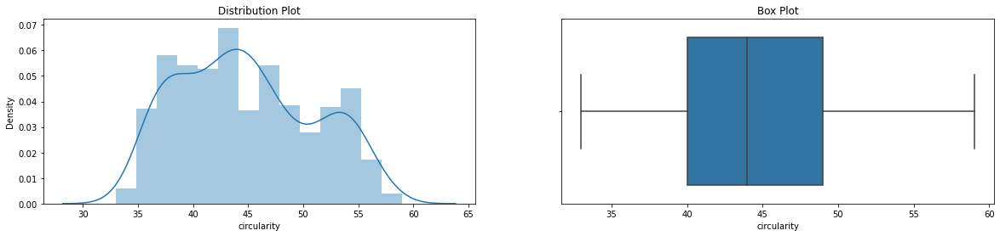

In [99]:
fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(20,4)
sns.distplot(veh['circularity'],ax=ax1)
ax1.set_title("Distribution Plot")

sns.boxplot(veh['circularity'],ax=ax2)
ax2.set_title("Box Plot")

> No ouliers found in circularity

Text(0.5, 1.0, 'Box Plot')

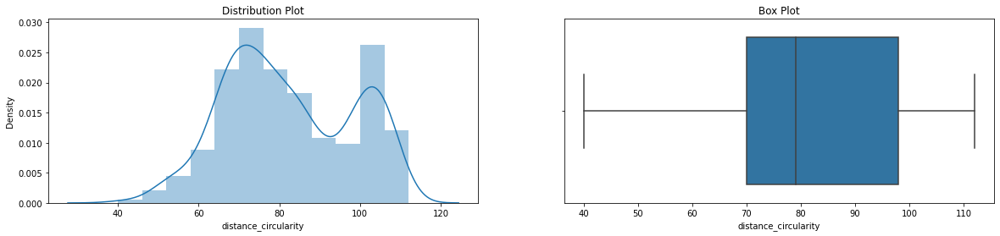

In [100]:
fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(20,4)
sns.distplot(veh['distance_circularity'],ax=ax1)
ax1.set_title("Distribution Plot")

sns.boxplot(veh['distance_circularity'],ax=ax2)
ax2.set_title("Box Plot")

> No ouliers found in distance_circularity

Text(0.5, 1.0, 'Box Plot')

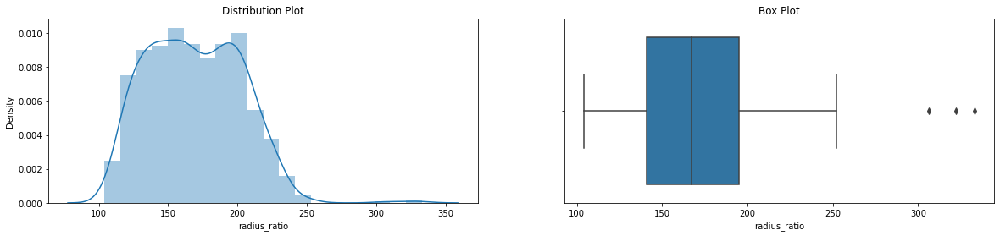

In [101]:
fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(20,4)
sns.distplot(veh['radius_ratio'],ax=ax1)
ax1.set_title("Distribution Plot")

sns.boxplot(veh['radius_ratio'],ax=ax2)
ax2.set_title("Box Plot")

> ouliers found in radius_ratio and will handle outliers in later section

Text(0.5, 1.0, 'Box Plot')

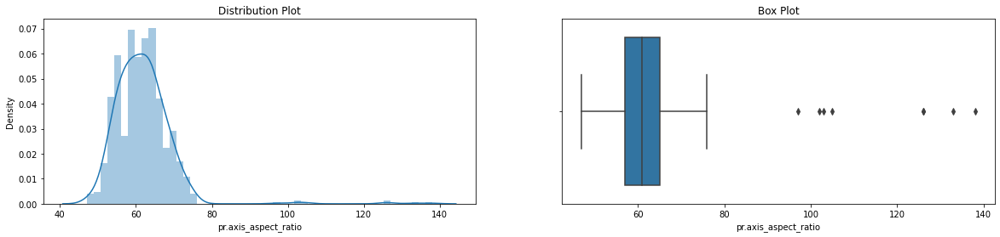

In [102]:
fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(20,4)
sns.distplot(veh['pr.axis_aspect_ratio'],ax=ax1)
ax1.set_title("Distribution Plot")

sns.boxplot(veh['pr.axis_aspect_ratio'],ax=ax2)
ax2.set_title("Box Plot")

> ouliers found in pr.axis_aspect_ratio and will handle outliers in later section

Text(0.5, 1.0, 'Box Plot')

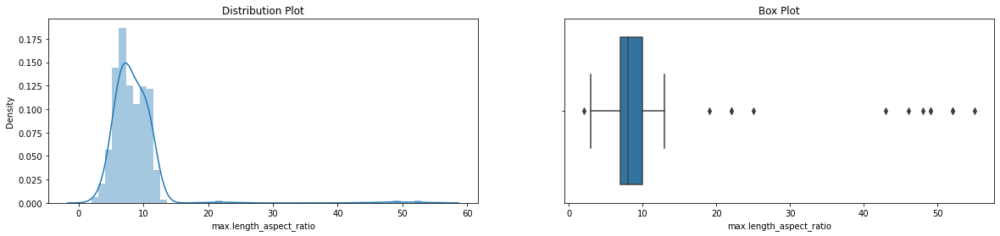

In [103]:
fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(20,4)
sns.distplot(veh['max.length_aspect_ratio'],ax=ax1)
ax1.set_title("Distribution Plot")

sns.boxplot(veh['max.length_aspect_ratio'],ax=ax2)
ax2.set_title("Box Plot")

> ouliers found in max.length_aspect_ratio and will handle outliers in later section

Text(0.5, 1.0, 'Box Plot')

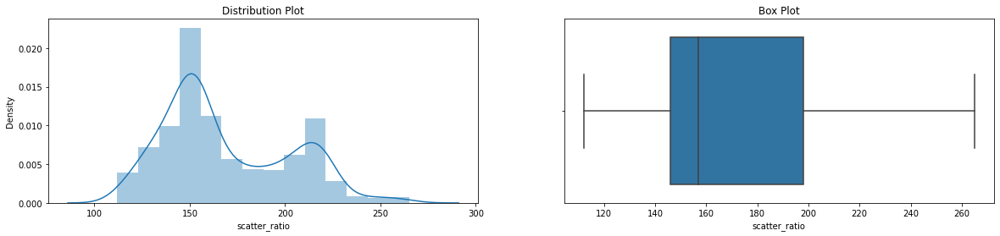

In [104]:
fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(20,4)
sns.distplot(veh['scatter_ratio'],ax=ax1)
ax1.set_title("Distribution Plot")

sns.boxplot(veh['scatter_ratio'],ax=ax2)
ax2.set_title("Box Plot")

> No ouliers found in scatter ratio

Text(0.5, 1.0, 'Box Plot')

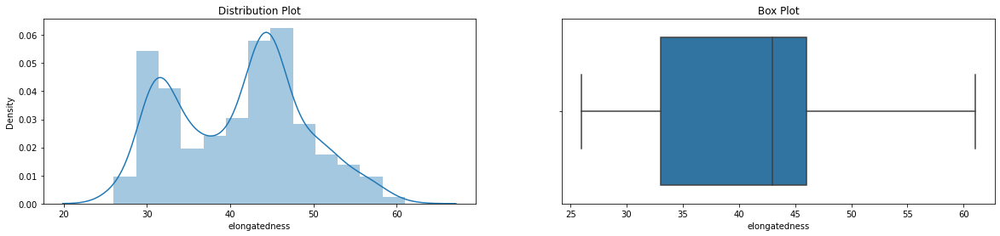

In [105]:
fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(20,4)
sns.distplot(veh['elongatedness'],ax=ax1)
ax1.set_title("Distribution Plot")

sns.boxplot(veh['elongatedness'],ax=ax2)
ax2.set_title("Box Plot")

Text(0.5, 1.0, 'Box Plot')

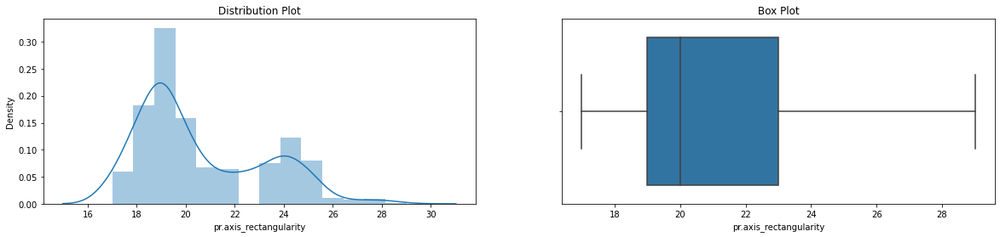

In [106]:
fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(20,4)
sns.distplot(veh['pr.axis_rectangularity'],ax=ax1)
ax1.set_title("Distribution Plot")

sns.boxplot(veh['pr.axis_rectangularity'],ax=ax2)
ax2.set_title("Box Plot")

Text(0.5, 1.0, 'Box Plot')

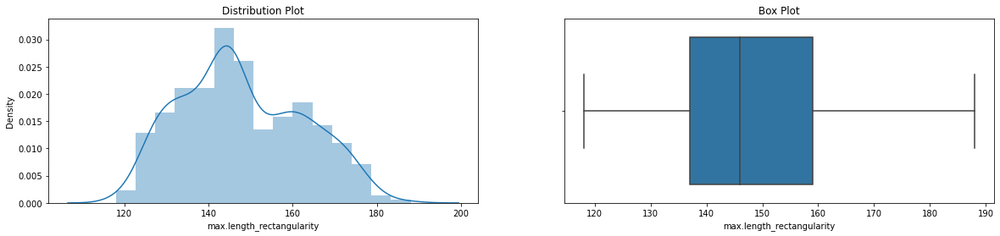

In [107]:
fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(20,4)
sns.distplot(veh['max.length_rectangularity'],ax=ax1)
ax1.set_title("Distribution Plot")

sns.boxplot(veh['max.length_rectangularity'],ax=ax2)
ax2.set_title("Box Plot")

Text(0.5, 1.0, 'Box Plot')

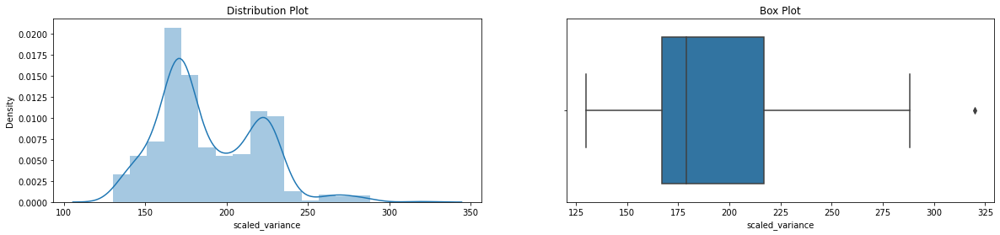

In [108]:
fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(20,4)
sns.distplot(veh['scaled_variance'],ax=ax1)
ax1.set_title("Distribution Plot")

sns.boxplot(veh['scaled_variance'],ax=ax2)
ax2.set_title("Box Plot")

Text(0.5, 1.0, 'Box Plot')

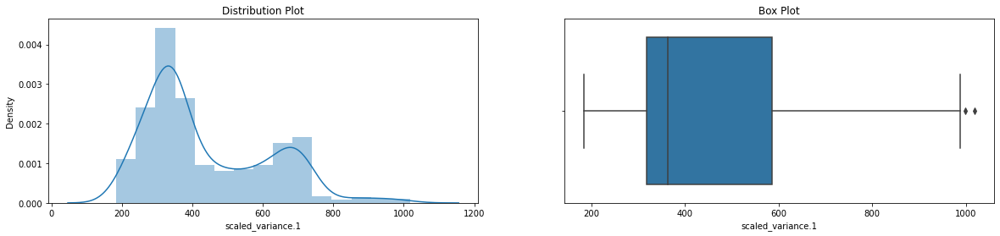

In [109]:
fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(20,4)
sns.distplot(veh['scaled_variance.1'],ax=ax1)
ax1.set_title("Distribution Plot")

sns.boxplot(veh['scaled_variance.1'],ax=ax2)
ax2.set_title("Box Plot")

Text(0.5, 1.0, 'Box Plot')

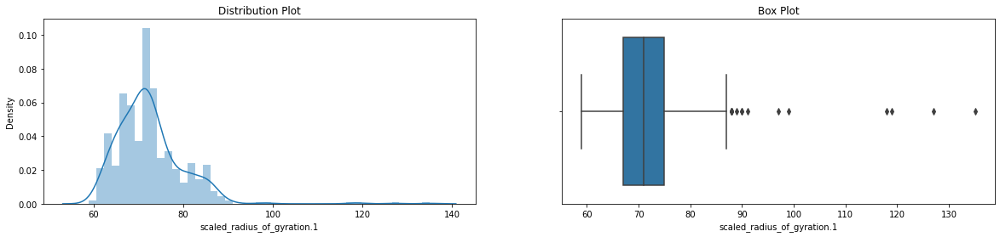

In [110]:
fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(20,4)
sns.distplot(veh['scaled_radius_of_gyration.1'],ax=ax1)
ax1.set_title("Distribution Plot")

sns.boxplot(veh['scaled_radius_of_gyration.1'],ax=ax2)
ax2.set_title("Box Plot")

> ouliers found in scaled_radius_of_gyration.1 and will handle outliers in later section

Text(0.5, 1.0, 'Box Plot')

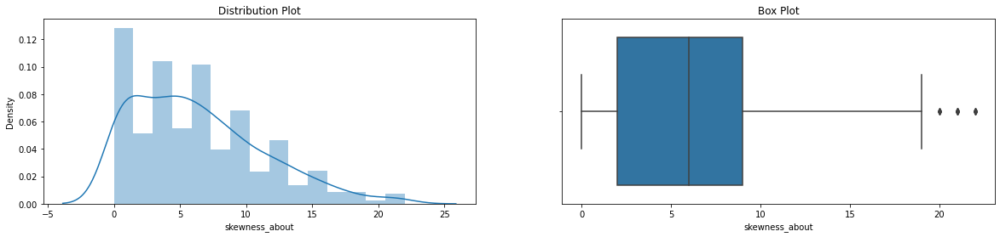

In [111]:
fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(20,4)
sns.distplot(veh['skewness_about'],ax=ax1)
ax1.set_title("Distribution Plot")

sns.boxplot(veh['skewness_about'],ax=ax2)
ax2.set_title("Box Plot")

> ouliers found in kewness_about and will handle outliers in later section

Text(0.5, 1.0, 'Box Plot')

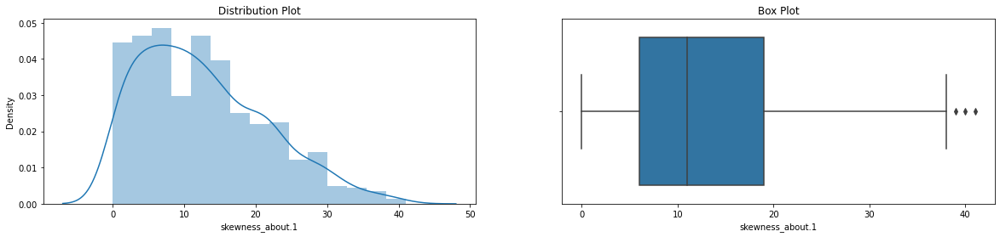

In [112]:
fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(20,4)
sns.distplot(veh['skewness_about.1'],ax=ax1)
ax1.set_title("Distribution Plot")

sns.boxplot(veh['skewness_about.1'],ax=ax2)
ax2.set_title("Box Plot")

> ouliers found in skewness_about.1 and will handle outliers in later section

Text(0.5, 1.0, 'Box Plot')

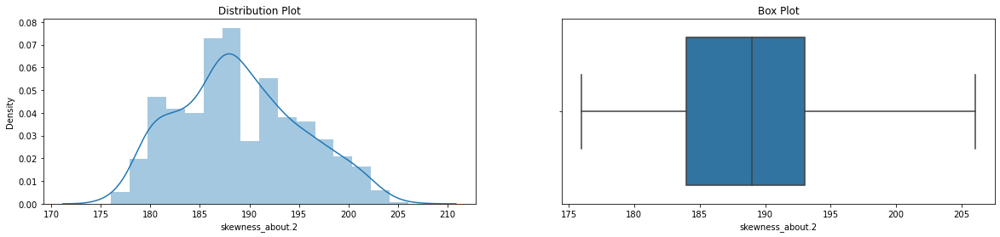

In [113]:
fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(20,4)
sns.distplot(veh['skewness_about.2'],ax=ax1)
ax1.set_title("Distribution Plot")

sns.boxplot(veh['skewness_about.2'],ax=ax2)
ax2.set_title("Box Plot")

Text(0.5, 1.0, 'Box Plot')

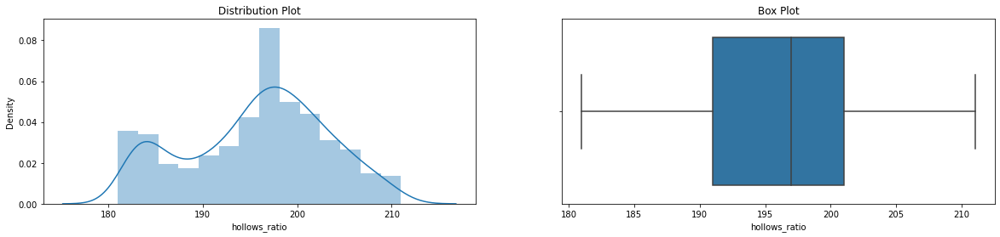

In [114]:
fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(20,4)
sns.distplot(veh['hollows_ratio'],ax=ax1)
ax1.set_title("Distribution Plot")

sns.boxplot(veh['hollows_ratio'],ax=ax2)
ax2.set_title("Box Plot")

> 1. from the above all univariant analysis, we can see some features has outliers in the dataset.
> 2. Outlier present in the skewness_about.1,skewness_about,scaled_variance.1,max.length_aspect_ratio,pr.axis_aspect_ratio,radius_ratio.

### Handling Outliers

In [115]:

def handleOutlier(aSeries):
    
    q1 = aSeries.quantile(0.25)
    q3 = aSeries.quantile(0.75)
   
    iqr = q3-q1 #Interquartile range
    fence_low  = q1-1.5*iqr
    fence_high = q3+1.5*iqr
    outliers_low = aSeries[(aSeries < fence_low)]
    outliers_high= aSeries[(aSeries > fence_high)]
    
    print ("25th Quantile value: ", q1)
    print('Outlier low Count =', outliers_low.count())
    print('List of Low outliers: \n')
    print(outliers_low)

    print ("75th Quantile value: ", q3)
    print('Outlier High Count = ', outliers_high.count())
    print('List of High outliers: \n')
    print(outliers_high)

### Handling Outliers in radius_ratio

In [116]:
handleOutlier(veh['radius_ratio'])

25th Quantile value:  141.0
Outlier low Count = 0
List of Low outliers: 

Series([], Name: radius_ratio, dtype: float64)
75th Quantile value:  195.0
Outlier High Count =  3
List of High outliers: 

37     306.0
135    322.0
388    333.0
Name: radius_ratio, dtype: float64


In [117]:
# Lets observe full rows for these outliers
veh.loc[[37,135,388]]

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
37,90,48.0,86.0,306.0,126.0,49,153.0,44.0,19.0,156,272.0,346.0,200.0,118.0,0.0,15.0,185.0,194,2
135,89,47.0,83.0,322.0,133.0,48,158.0,43.0,20.0,163,229.0,364.0,176.0,97.0,0.0,14.0,184.0,194,2
388,94,47.0,85.0,333.0,138.0,49,155.0,43.0,19.0,155,320.0,354.0,187.0,135.0,12.0,9.0,188.0,196,2


> All the outliers found in class 2 i.e., Van. Now let see the highest inrange values of class 2 

In [118]:
# All these are for class van. Lets observe maximum radius_ratio for class van
veh[veh['class']==2]['radius_ratio'].sort_values( ascending=False).head(8)

388    333.0
135    322.0
37     306.0
706    250.0
291    246.0
523    231.0
0      178.0
535    176.0
Name: radius_ratio, dtype: float64

In [119]:
# values of radius ratio for outlier are far away  from the max value 250. Lets replace these values with 250
veh.loc[[37,135,388],'radius_ratio']=250.0

In [120]:
#re-check the outliers rows again, to see the changed values
# Lets observe full rows for these outliers
veh.loc[[37,135,388]]

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
37,90,48.0,86.0,250.0,126.0,49,153.0,44.0,19.0,156,272.0,346.0,200.0,118.0,0.0,15.0,185.0,194,2
135,89,47.0,83.0,250.0,133.0,48,158.0,43.0,20.0,163,229.0,364.0,176.0,97.0,0.0,14.0,184.0,194,2
388,94,47.0,85.0,250.0,138.0,49,155.0,43.0,19.0,155,320.0,354.0,187.0,135.0,12.0,9.0,188.0,196,2


### Handling Outliers in pr.axis_aspect_ratio

In [121]:
handleOutlier(veh['pr.axis_aspect_ratio'])

25th Quantile value:  57.0
Outlier low Count = 0
List of Low outliers: 

Series([], Name: pr.axis_aspect_ratio, dtype: float64)
75th Quantile value:  65.0
Outlier High Count =  8
List of High outliers: 

4      103.0
37     126.0
100    126.0
135    133.0
291    102.0
388    138.0
523     97.0
706    105.0
Name: pr.axis_aspect_ratio, dtype: float64


In [122]:
# Lets observe full rows for these outliers
veh.loc[[4,37,100,135,291,388,523,706]]

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,0
37,90,48.0,86.0,250.0,126.0,49,153.0,44.0,19.0,156,272.0,346.0,200.0,118.0,0.0,15.0,185.0,194,2
100,82,45.0,66.0,252.0,126.0,52,148.0,45.0,19.0,144,237.0,326.0,185.0,119.0,1.0,1.0,181.0,185,0
135,89,47.0,83.0,250.0,133.0,48,158.0,43.0,20.0,163,229.0,364.0,176.0,97.0,0.0,14.0,184.0,194,2
291,89,45.0,81.0,246.0,102.0,43,155.0,44.0,20.0,160,200.0,347.0,177.0,90.0,9.0,17.0,183.0,192,2
388,94,47.0,85.0,250.0,138.0,49,155.0,43.0,19.0,155,320.0,354.0,187.0,135.0,12.0,9.0,188.0,196,2
523,90,43.0,81.0,231.0,97.0,46,150.0,45.0,19.0,149,200.0,332.0,164.0,91.0,5.0,9.0,186.0,196,2
706,82,43.0,70.0,250.0,105.0,55,139.0,48.0,18.0,145,231.0,289.0,172.0,99.0,4.0,9.0,190.0,199,2


> Index 4 and 100 belong to class 0 i.e., Bus rest all are Van

In [123]:
# Lets Check for Bus first
veh[veh['class']==0]['pr.axis_aspect_ratio'].sort_values( ascending=False).head(8)

100    126.0
4      103.0
84      76.0
556     75.0
641     75.0
88      75.0
450     75.0
275     75.0
Name: pr.axis_aspect_ratio, dtype: float64

In [124]:
#For bus we can see values around 75 and max value 76. It is better to drop this row as the values 103&206 is 
#significantly higher
#lets drop these two index
veh.drop([4,100], inplace=True)


In [125]:
# Lets Check for van now first
veh[veh['class']==2]['pr.axis_aspect_ratio'].sort_values( ascending=False).head(20)

388    138.0
135    133.0
37     126.0
706    105.0
291    102.0
523     97.0
0       72.0
668     70.0
732     69.0
149     69.0
744     68.0
68      68.0
191     68.0
457     68.0
722     68.0
234     68.0
449     68.0
572     67.0
172     67.0
128     67.0
Name: pr.axis_aspect_ratio, dtype: float64

In [126]:
##From 72 to 97 it is big jump in value and then other outlier values are even higher upto 138. It is better to drop 
#these rows
veh.drop([37,135,291,388,523,706], inplace=True)

### Handling Outliers in scaled_variance.1

In [127]:
handleOutlier(veh['scaled_variance.1'])

25th Quantile value:  317.0
Outlier low Count = 0
List of Low outliers: 

Series([], Name: scaled_variance.1, dtype: float64)
75th Quantile value:  587.0
Outlier High Count =  2
List of High outliers: 

85      998.0
835    1018.0
Name: scaled_variance.1, dtype: float64


In [128]:
#75% data lies in the range of 587. so drop these two index
veh.drop([85,835], inplace=True)

### Handling Outliers in scaled_radius_of_gyration.1

In [129]:
handleOutlier(veh['scaled_radius_of_gyration.1'])

25th Quantile value:  67.0
Outlier low Count = 0
List of Low outliers: 

Series([], Name: scaled_radius_of_gyration.1, dtype: float64)
75th Quantile value:  75.0
Outlier High Count =  7
List of High outliers: 

47     88.0
79     88.0
230    89.0
381    88.0
498    88.0
655    90.0
815    88.0
Name: scaled_radius_of_gyration.1, dtype: float64


In [130]:
##### Lets observe full row for this outliers
veh.loc[[47,79,230,381,498,655,815]]

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
47,85,42.0,66.0,122.0,54.0,6,148.0,46.0,19.0,141,172.0,317.0,174.0,88.0,6.0,14.0,180.0,182,0
79,89,44.0,68.0,113.0,50.0,7,150.0,45.0,19.0,147,171.0,328.0,189.0,88.0,6.0,5.0,179.0,182,0
230,85,35.0,47.0,110.0,55.0,3,117.0,57.0,17.0,122,136.0,203.0,139.0,89.0,5.0,9.0,180.0,184,2
381,106,54.0,100.0,227.0,67.0,4,250.0,27.0,27.0,162,280.0,923.0,262.0,88.0,5.0,11.0,182.0,182,0
498,88,36.0,53.0,113.0,57.0,3,118.0,57.0,17.0,128,137.0,204.0,136.0,88.0,7.0,14.0,180.0,183,2
655,86,35.0,44.0,110.0,54.0,2,119.0,57.0,17.0,121,139.0,208.0,137.0,90.0,6.0,1.0,180.0,183,2
815,81,45.0,68.0,154.0,69.0,22,151.0,45.0,19.0,147,186.0,335.0,186.0,88.0,1.0,10.0,180.0,185,0


In [131]:
veh[veh['class']==0]['scaled_radius_of_gyration.1'].sort_values( ascending=False).head(8)

381    88.0
815    88.0
47     88.0
79     88.0
558    87.0
568    87.0
790    87.0
99     87.0
Name: scaled_radius_of_gyration.1, dtype: float64

In [132]:
veh[veh['class']==1]['scaled_radius_of_gyration.1'].sort_values( ascending=False).head(8)

463    87.0
612    87.0
160    87.0
515    87.0
351    86.0
231    86.0
834    86.0
342    85.0
Name: scaled_radius_of_gyration.1, dtype: float64

> It is seen both the class has nominal range value. So there is no need to change the value

In [133]:
veh.shape # final dataset after dealing the outliears

(803, 19)

## EDA

## CLASSIFIERS

In [134]:
veh['class'].value_counts()

1    413
0    201
2    189
Name: class, dtype: int64

In [135]:
# lets build our SVM model on original dataset with all attributes
# independant variables
X = veh.drop(['class'], axis=1)
# the dependent variable
y = veh[['class']]

In [136]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
# checking the dimensions of the train & test subset
# to print dimension of train set
print(X_train.shape)
# to print dimension of test set
print(X_test.shape)

(562, 18)
(241, 18)


# Model training, testing and tuning:

In [137]:
# Building a Support Vector Machine on train data
svc_model = svm.SVC(C= 1, kernel='linear', gamma=.1)
svc_model.fit(X_train, y_train)

prediction = svc_model .predict(X_test)
# check the accuracy on the training set & test set
print(svc_model.score(X_train, y_train))
print(svc_model.score(X_test, y_test))

0.9911032028469751
0.966804979253112


In [138]:
# Building a Support Vector Machine on train data
svc_model = svm.SVC(kernel='rbf')
# svc_model = SVC(kernel='rbf')
svc_model.fit(X_train, y_train)
prediction = svc_model.predict(X_test)
print(svc_model.score(X_train, y_train))
print(svc_model.score(X_test, y_test))

0.6565836298932385
0.5975103734439834


In [139]:
#Building a Support Vector Machine on train data(changing the kernel)
svc_model = svm.SVC(C= 1, kernel='poly', gamma= .1)
# svc_model  = SVC(kernel='poly')
svc_model.fit(X_train, y_train)

prediction = svc_model.predict(X_test)

print(svc_model.score(X_train, y_train))
print(svc_model.score(X_test, y_test))


1.0
0.979253112033195


In [140]:
svc_model = svm.SVC(C= 1, kernel='sigmoid', gamma= .1)
# svc_model = SVC(kernel='sigmoid')
svc_model.fit(X_train, y_train)

prediction = svc_model.predict(X_test)

print(svc_model.score(X_train, y_train))
print(svc_model.score(X_test, y_test))


0.5195729537366548
0.5020746887966805


> on seeing the different kernel --> only linear kernel trick has highest accuracy than remaining kernel

## APPLYING PCA ON DATASET

In [141]:
# independant variables
Xv = veh.drop(['class'], axis=1)
# the dependent variable
yv = veh[['class']]

In [142]:
XScaledv=Xv.apply(zscore)
XScaledv.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
0,0.161484,0.526476,0.061536,0.309838,1.901860,0.777389,-0.197825,0.129459,-0.216647,0.772571,-0.383343,-0.339759,0.310883,-0.317688,-0.074059,0.366749,-0.332006,0.163075
1,-0.326003,-0.613040,0.124806,-0.845918,-0.754129,0.345387,-0.593210,0.514006,-0.608467,-0.330072,-0.581301,-0.621979,-0.495806,-0.000198,0.534846,0.143559,-0.006883,0.433912
2,1.258330,0.852052,1.516737,1.278174,0.839464,0.777389,1.170815,-1.152364,0.958811,0.703656,1.167327,1.134697,1.427837,0.158548,1.549688,-0.414416,-0.169444,0.027657
3,-0.082260,-0.613040,-0.001733,-0.283658,0.308267,0.345387,-0.745281,0.642189,-0.608467,-0.330072,-0.911231,-0.742930,-1.457627,-1.428905,-0.074059,-0.302821,1.618729,1.517260
6,0.405227,-0.287464,-0.571160,0.153655,0.662399,-0.950621,-0.471553,0.129459,-0.608467,-0.330072,-0.383343,-0.443431,-0.061435,-0.952669,1.346720,-1.307177,1.781291,1.111004


In [143]:
covMatrixv = np.cov(XScaledv,rowvar=False)
print(covMatrixv)
pcav = PCA(n_components=18)
pcav.fit(XScaledv)

[[ 1.00124688  0.69009159  0.78978884  0.75098269  0.20620388  0.44852197
   0.81286505 -0.78688685  0.81346533  0.67719438  0.79320538  0.81963343
   0.58096822 -0.27904583  0.23148426  0.16880361  0.3018444   0.38394087]
 [ 0.69009159  1.00124688  0.79838237  0.65589623  0.21789574  0.50829338
   0.8593797  -0.82573381  0.85789213  0.96730627  0.81964786  0.85280243
   0.936372    0.04150912  0.14401174 -0.00101587 -0.10783313  0.05993802]
 [ 0.78978884  0.79838237  1.00124688  0.82169039  0.2622245   0.59888405
   0.9120776  -0.91404623  0.90109962  0.77432603  0.89168702  0.89600842
   0.70672751 -0.275402    0.11016307  0.27852555  0.14903347  0.35131996]
 [ 0.75098269  0.65589623  0.82169039  1.00124688  0.67125909  0.42830059
   0.80779078 -0.85719381  0.7811532   0.59124495  0.81364651  0.79935636
   0.57007737 -0.41513751  0.05812201  0.19466282  0.42009053  0.5131361 ]
 [ 0.20620388  0.21789574  0.2622245   0.67125909  1.00124688  0.16789303
   0.22664078 -0.32431764  0.19282

PCA(n_components=18)

In [144]:
print("Eigen values")
print(pcav.explained_variance_)

print()
print("Eigen vector")
print(pcav.components_)
print()
print("% of ratio")
print(pcav.explained_variance_ratio_)

Eigen values
[9.85316868e+00 3.30476802e+00 1.19362271e+00 1.14603982e+00
 8.87679839e-01 6.65775351e-01 3.46417737e-01 2.23877897e-01
 1.19588491e-01 8.98346083e-02 6.13763258e-02 4.52069536e-02
 2.95876443e-02 2.14550598e-02 1.52304321e-02 1.23993856e-02
 6.05228912e-03 3.62652319e-04]

Eigen vector
[[ 2.71490288e-01  2.85952624e-01  3.01074257e-01  2.76606032e-01
   1.06622505e-01  1.78617606e-01  3.10015927e-01 -3.07699686e-01
   3.06954596e-01  2.74661463e-01  3.03164014e-01  3.07447271e-01
   2.60054805e-01 -5.68452157e-02  3.99417095e-02  6.40445488e-02
   4.27135556e-02  9.39801911e-02]
 [-8.51677220e-02  1.45045704e-01 -4.08480406e-02 -1.90964438e-01
  -2.42190602e-01 -8.42028141e-02  7.50143821e-02 -1.44060413e-02
   8.81951449e-02  1.30919863e-01  7.23521676e-02  7.91995187e-02
   2.14244181e-01  5.05139518e-01 -3.78591775e-02 -8.66192015e-02
  -5.09421369e-01 -5.06016305e-01]
 [-3.39237596e-02 -2.08171781e-01  7.37903561e-02  4.28458575e-02
  -1.09406339e-01 -1.50626269e-01

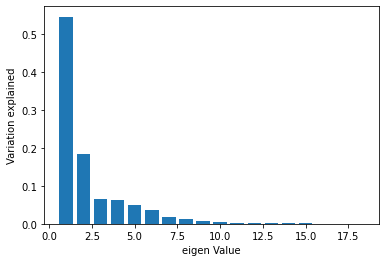

In [145]:
plt.bar(list(range(1,19)),pcav.explained_variance_ratio_,alpha=1, align='center')
plt.ylabel('Variation explained')
plt.xlabel('eigen Value')
plt.show()

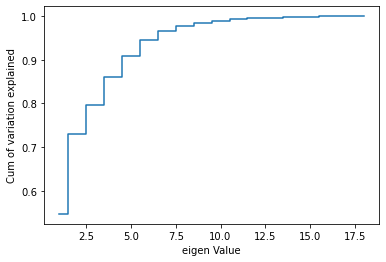

In [146]:
plt.step(list(range(1,19)),np.cumsum(pcav.explained_variance_ratio_), where='mid')
plt.ylabel('Cum of variation explained')
plt.xlabel('eigen Value')
plt.show()


> Now we have high percentage of data with first 8 PC's (98%)

In [147]:
pca8 = PCA(n_components=8)
pca8.fit(XScaledv)
print("Eigen vector")
print(pca8.components_)

print()
print("Eigen values")
print(pca8.explained_variance_)
print()
print("% of Ratio")
print(pca8.explained_variance_ratio_)
print()

Xpca8 = pca8.transform(XScaledv)

Eigen vector
[[ 2.71490288e-01  2.85952624e-01  3.01074257e-01  2.76606032e-01
   1.06622505e-01  1.78617606e-01  3.10015927e-01 -3.07699686e-01
   3.06954596e-01  2.74661463e-01  3.03164014e-01  3.07447271e-01
   2.60054805e-01 -5.68452157e-02  3.99417095e-02  6.40445488e-02
   4.27135556e-02  9.39801911e-02]
 [-8.51677220e-02  1.45045704e-01 -4.08480406e-02 -1.90964438e-01
  -2.42190602e-01 -8.42028141e-02  7.50143821e-02 -1.44060413e-02
   8.81951449e-02  1.30919863e-01  7.23521676e-02  7.91995187e-02
   2.14244181e-01  5.05139518e-01 -3.78591775e-02 -8.66192015e-02
  -5.09421369e-01 -5.06016305e-01]
 [-3.39237596e-02 -2.08171781e-01  7.37903561e-02  4.28458575e-02
  -1.09406339e-01 -1.50626269e-01  1.10569204e-01 -9.48231995e-02
   1.09639586e-01 -2.19581127e-01  1.41608408e-01  1.12578605e-01
  -2.16679197e-01  6.54572399e-02 -5.07019216e-01  6.97957732e-01
  -5.25209442e-02 -3.44651597e-02]
 [ 1.57426750e-01 -2.42198039e-02  9.25313756e-02 -2.39821069e-01
  -6.07570730e-01  2.231

In [148]:
RD =pd.DataFrame(Xpca8) # Reduced datasets
RD

,0,1,2,3,4,5,6,7
0,0.584693,-0.550678,-0.525324,-0.845685,0.798408,1.665776,-0.398156,-0.656088
1,-1.523765,-0.346318,-0.196934,1.166282,0.423647,0.044328,0.106581,0.159600
2,3.924737,0.332592,-1.145952,0.190168,-0.791313,0.703001,0.715672,0.273497
3,-1.501255,-3.015644,-0.406646,0.210754,0.623996,-0.433519,0.072621,-0.170661
4,-0.728069,-2.261337,-1.857665,-0.222465,-1.474451,-0.545387,-0.252410,-0.175707
...,...,...,...,...,...,...,...,...
798,-0.345044,-0.608478,1.519559,0.175649,-0.596555,1.008414,0.782006,0.296129
799,-0.072295,-0.058909,0.468822,-0.486862,1.874889,1.175636,-0.549670,-0.319003
800,5.111954,0.019090,-0.601384,-1.086508,1.121665,-0.342291,0.785494,-0.318070
801,-3.258740,-1.100753,1.908313,0.254881,0.535336,-0.051184,-0.356089,0.425050


## CLASSIFIER AFTER PCA

In [149]:
# lets build our SVM model on original dataset with reduced attributes
# independant variables
X = RD
# the dependent variable
y = veh[['class']]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
# checking the dimensions of the train & test subset
# to print dimension of train set
print(X_train.shape)
# to print dimension of test set
print(X_test.shape)

(562, 8)
(241, 8)


In [150]:
# Building a Support Vector Machine on train data
svc_modelpca = svm.SVC(C= .1, kernel='linear', gamma=1)
svc_modelpca.fit(X_train, y_train)

prediction = svc_modelpca .predict(X_test)
# check the accuracy on the training set & test set
print(svc_modelpca.score(X_train, y_train))
print(svc_modelpca.score(X_test, y_test))

0.8718861209964412
0.8547717842323651


In [155]:
#with rbf

# Building a Support Vector Machine on train data
svc_modelpca = SVC(kernel='rbf')
svc_modelpca.fit(X_train, y_train)

prediction = svc_modelpca.predict(X_test)


print(svc_modelpca.score(X_train, y_train))
print(svc_modelpca.score(X_test, y_test))


0.9679715302491103
0.941908713692946


In [156]:
#With Hyper Parameters Tuning
#2-3,SVM
#importing modules
from sklearn.model_selection import GridSearchCV
from sklearn import svm
#making the instance
model=svm.SVC()
#Hyper Parameters Set
params = {'C': [0.01, 0.05, 0.5, 1], 
      #    'gamma':[0.01, 0.02 , 0.03 , 0.04, 0.05],
          'kernel': ['linear','rbf']}
#Making models with hyper parameters sets
gs = GridSearchCV(model, param_grid=params, n_jobs=-1,cv=10)
#Learning
gs.fit(X_train,y_train)

GridSearchCV(cv=10, estimator=SVC(), n_jobs=-1,
             param_grid={'C': [0.01, 0.05, 0.5, 1],
                         'kernel': ['linear', 'rbf']})

In [157]:
#The best hyper parameters set
print("Best Hyper Parameters:\n",gs.best_params_)

Best Hyper Parameters:
 {'C': 1, 'kernel': 'rbf'}


In [158]:
num_folds = 10
seed = 7

kfold = KFold(n_splits=num_folds, random_state=None)
model = gs
results = cross_val_score(gs,X_train,y_train, cv=kfold)
print(results)
print("Accuracy: %.3f%% (%.3f%%)" % (results.mean()*100.0, results.std()*100.0))

[1.         0.98245614 0.96428571 0.94642857 0.92857143 0.92857143
 0.94642857 0.91071429 0.92857143 0.92857143]
Accuracy: 94.646% (2.653%)


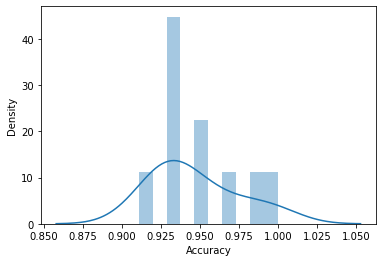

95.0 confidence interval 91.5% and 99.6%


In [159]:
#plt.hist(results,normed= True)
sns.distplot(results,kde=True,bins=10)
plt.xlabel("Accuracy")
plt.show()
# confidence intervals
alpha = 0.95                             # for 95% confidence 
p = ((1.0-alpha)/2.0) * 100              # tail regions on right and left .25 on each side indicated by P value (border)
lower = max(0.0, np.percentile(results, p))  
p = (alpha+((1.0-alpha)/2.0)) * 100
upper = min(1.0, np.percentile(results, p))
print('%.1f confidence interval %.1f%% and %.1f%%' % (alpha*100, lower*100, upper*100))

In [160]:
#Test Accuracy with Hypertuned parameter
prediction=gs.predict(X_test)
print("Accuracy:",metrics.accuracy_score(prediction,y_test))
#evaluation(Confusion Metrix)
print("Confusion Matrix:\n",metrics.confusion_matrix(y_test,prediction))

Accuracy: 0.941908713692946
Confusion Matrix:
 [[ 64   3   0]
 [  0 116   5]
 [  3   3  47]]


    Looking at Confusion matric :Model predicted 
    
        Predicted van 47/53 (87%)
        Predicted car 116/121(96%)
        Predicted bus 64/67(96%)
        
        Over all accuracy 94% 

# CONCLUSION

## With all attributes we have got 96% on test data. 

## On reducing the dimension from 18 to 8 , we have got the overall accuracy of the model is 87% on training data and 86% on  test data. 

## > Here PCA helped to reduce the 18 attributes to 8 attributes without much loss in original data. 

## > Also helped in computation's time.


_________________________________________________________________

# AIML Module Project - UNSUPERVISED LEARNING - Project 4

# DOMAIN :- Sports management

_________________________________________________________________


In [169]:
# Importing the dataset

sport= pd.read_csv('Part4 - batting_bowling_ipl_bat.csv')
sport.head(25)


,Name,Runs,Ave,SR,Fours,Sixes,HF
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,CH Gayle,733.0,61.08,160.74,46.0,59.0,9.0
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,G Gambhir,590.0,36.87,143.55,64.0,17.0,6.0
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,V Sehwag,495.0,33.00,161.23,57.0,19.0,5.0
6,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,CL White,479.0,43.54,149.68,41.0,20.0,5.0
8,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,S Dhawan,569.0,40.64,129.61,58.0,18.0,5.0


In [167]:
print("Shape")
print("Size:",sport.shape)

Shape
Size: (180, 7)


In [168]:
sport.isna().sum()

Name     90
Runs     90
Ave      90
SR       90
Fours    90
Sixes    90
HF       90
dtype: int64

In [170]:
# it is seen from the sample that alternate rows got NaN value. so drop na to get final set

sport.dropna(inplace=True)

In [171]:
print("Final Shape")
print("Size:",sport.shape)

Final Shape
Size: (90, 7)


In [172]:
#Re-check the NaN
sport.isna().sum()

Name     0
Runs     0
Ave      0
SR       0
Fours    0
Sixes    0
HF       0
dtype: int64

In [173]:
sport.describe()

,Runs,Ave,SR,Fours,Sixes,HF
count,90.000000,90.000000,90.000000,90.000000,90.000000,90.000000
mean,219.933333,24.729889,119.164111,19.788889,7.577778,1.188889
std,156.253669,13.619215,23.656547,16.399845,8.001373,1.688656
min,2.000000,0.500000,18.180000,0.000000,0.000000,0.000000
25%,98.000000,14.665000,108.745000,6.250000,3.000000,0.000000
50%,196.500000,24.440000,120.135000,16.000000,6.000000,0.500000
75%,330.750000,32.195000,131.997500,28.000000,10.000000,2.000000
max,733.000000,81.330000,164.100000,73.000000,59.000000,9.000000


### Lets see the each feature distribution

Text(0.5, 1.0, 'Box Plot')

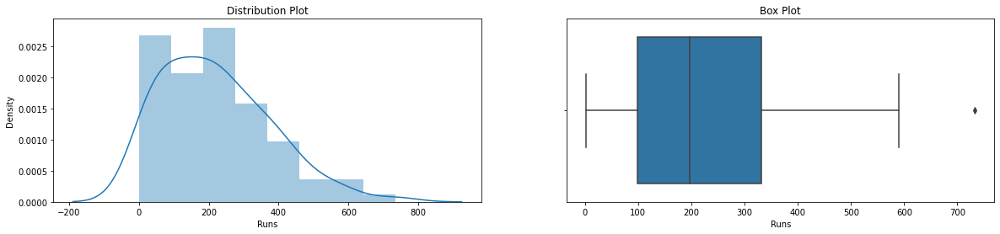

In [176]:
fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(20,4)
sns.distplot(sport['Runs'],ax=ax1)
ax1.set_title("Distribution Plot")

sns.boxplot(sport['Runs'],ax=ax2)
ax2.set_title("Box Plot")

Text(0.5, 1.0, 'Box Plot')

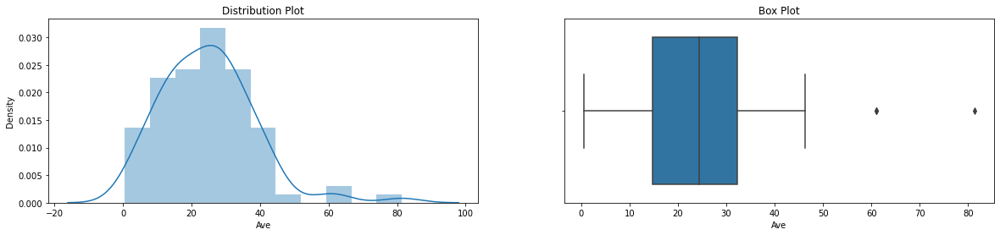

In [177]:
fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(20,4)
sns.distplot(sport['Ave'],ax=ax1)
ax1.set_title("Distribution Plot")

sns.boxplot(sport['Ave'],ax=ax2)
ax2.set_title("Box Plot")

Text(0.5, 1.0, 'Box Plot')

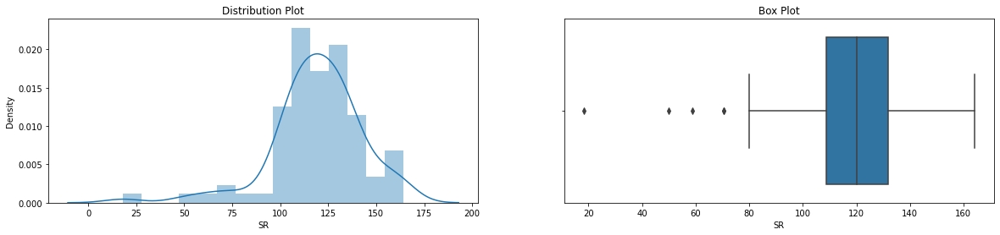

In [178]:
fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(20,4)
sns.distplot(sport['SR'],ax=ax1)
ax1.set_title("Distribution Plot")

sns.boxplot(sport['SR'],ax=ax2)
ax2.set_title("Box Plot")

Text(0.5, 1.0, 'Box Plot')

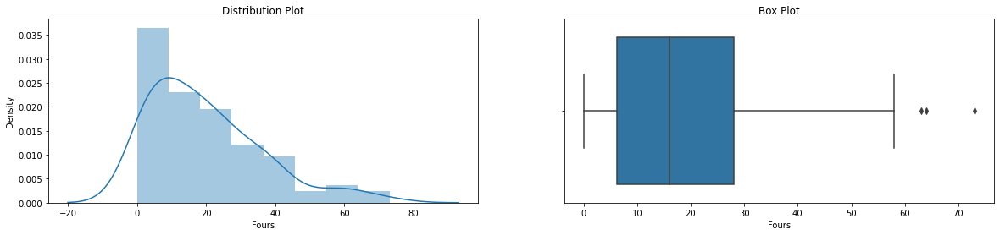

In [180]:
fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(20,4)
sns.distplot(sport['Fours'],ax=ax1)
ax1.set_title("Distribution Plot")

sns.boxplot(sport['Fours'],ax=ax2)
ax2.set_title("Box Plot")

Text(0.5, 1.0, 'Box Plot')

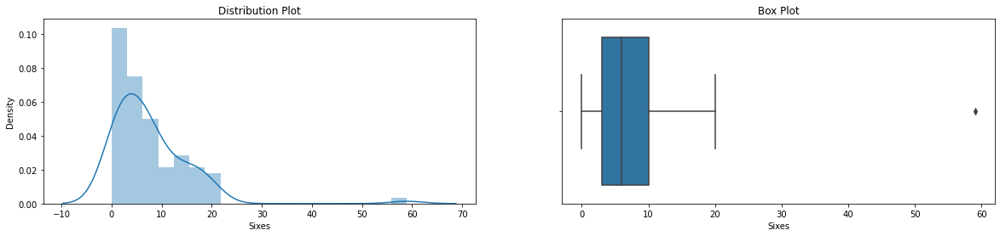

In [181]:
fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(20,4)
sns.distplot(sport['Sixes'],ax=ax1)
ax1.set_title("Distribution Plot")

sns.boxplot(sport['Sixes'],ax=ax2)
ax2.set_title("Box Plot")

Text(0.5, 1.0, 'Box Plot')

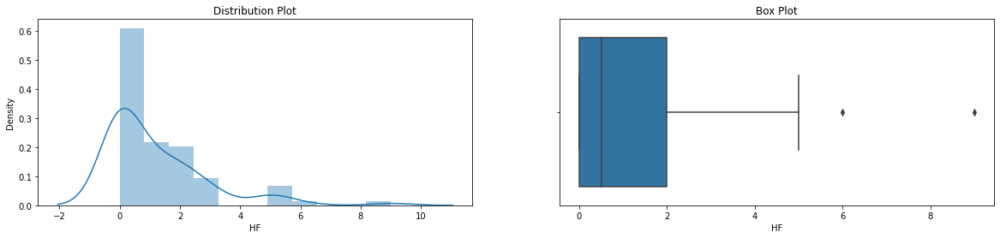

In [182]:
fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(20,4)
sns.distplot(sport['HF'],ax=ax1)
ax1.set_title("Distribution Plot")

sns.boxplot(sport['HF'],ax=ax2)
ax2.set_title("Box Plot")

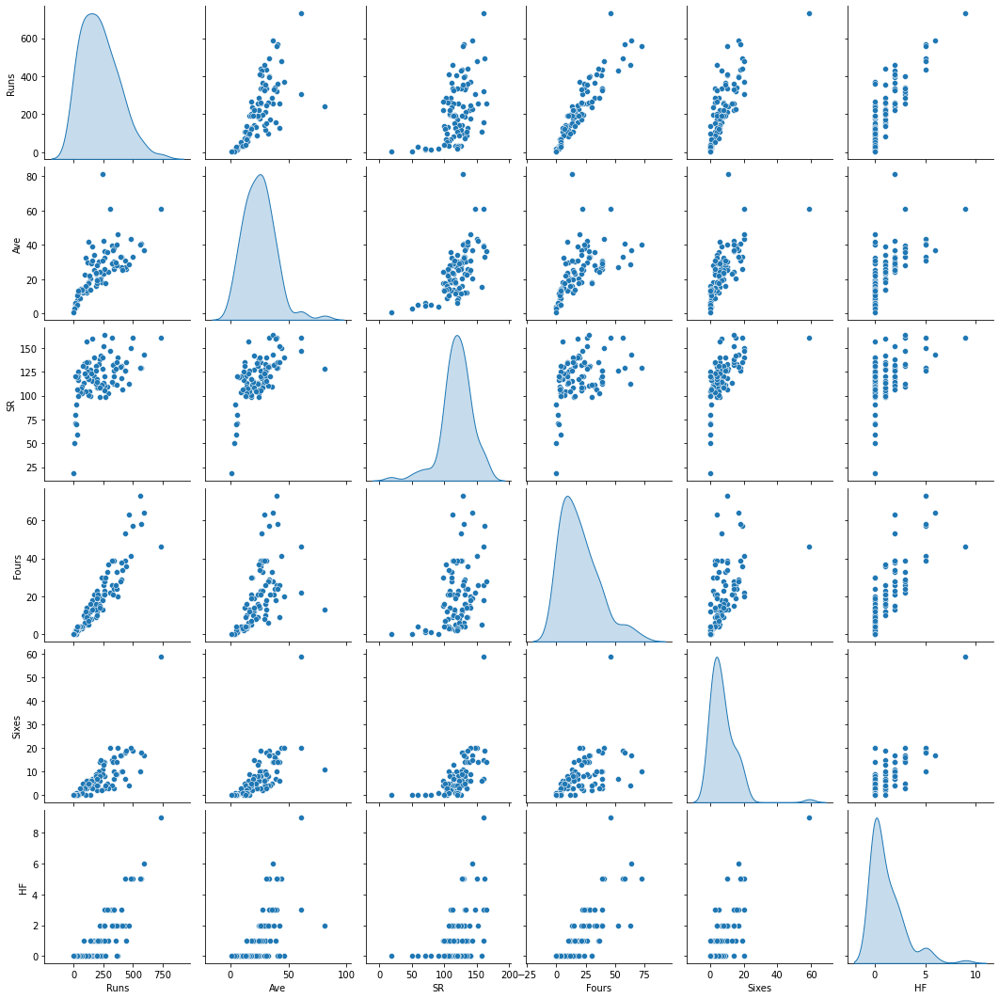

In [185]:
sns.pairplot(sport,diag_kind='kde')

### Runs,avg,4's,6's,HF attributes have positive correlation 

In [187]:
Sportcorr = sport.corr()
Sportcorr

,Runs,Ave,SR,Fours,Sixes,HF
Runs,1.000000,0.692984,0.493489,0.918809,0.769778,0.835148
Ave,0.692984,1.000000,0.623606,0.546211,0.682414,0.620754
SR,0.493489,0.623606,1.000000,0.384810,0.583943,0.427584
Fours,0.918809,0.546211,0.384810,1.000000,0.522574,0.783689
Sixes,0.769778,0.682414,0.583943,0.522574,1.000000,0.767696
HF,0.835148,0.620754,0.427584,0.783689,0.767696,1.000000


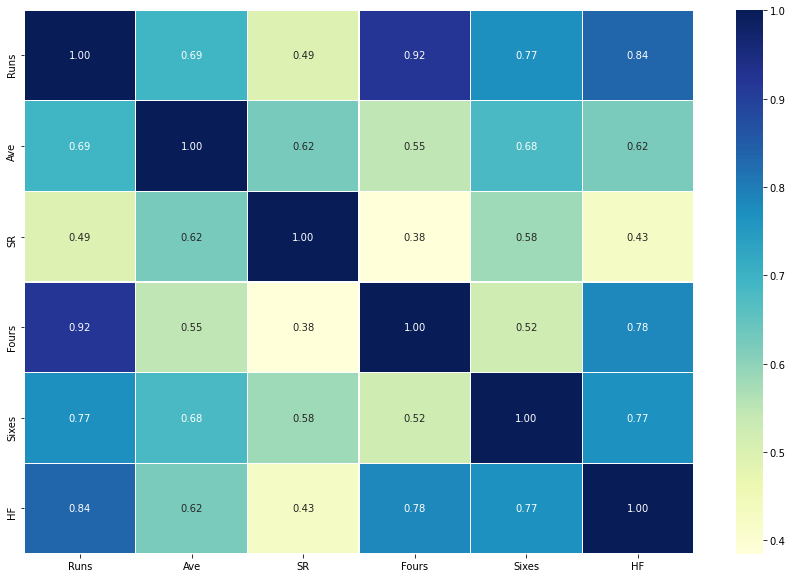

In [188]:
fig,ax = plt.subplots(figsize=(15, 10))   
sns.heatmap(Sportcorr, ax=ax, annot=True, linewidths=0.05, fmt= '.2f',cmap="YlGnBu") 
plt.show()

> 1. As seen in correlation Runs has high positive with 4's,6's and HF


## Detailed EDA

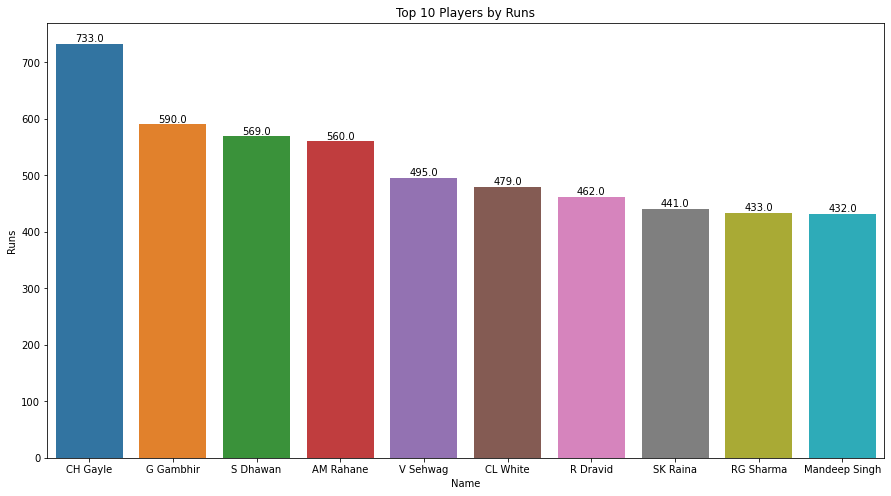

In [225]:
fig, ax = plt.subplots()
fig.set_size_inches(15,8)
b1=sport.groupby('Name')['Runs'].sum().sort_values(ascending = False ).head(10)
b1= b1.reset_index() 
b1.columns = ['Name' ,'Runs']
ax=sns.barplot(data = b1, x= 'Name' , y ='Runs'); 
plt.title("Top 10 Players by Runs");


for p in ax.patches: 
    ax.annotate(str((np.round(p.get_height()/len(b1)*10,decimals=2))), (p.get_x()+p.get_width()/2., p.get_height()), ha='center', va='center', xytext=(0, 5), textcoords='offset points')

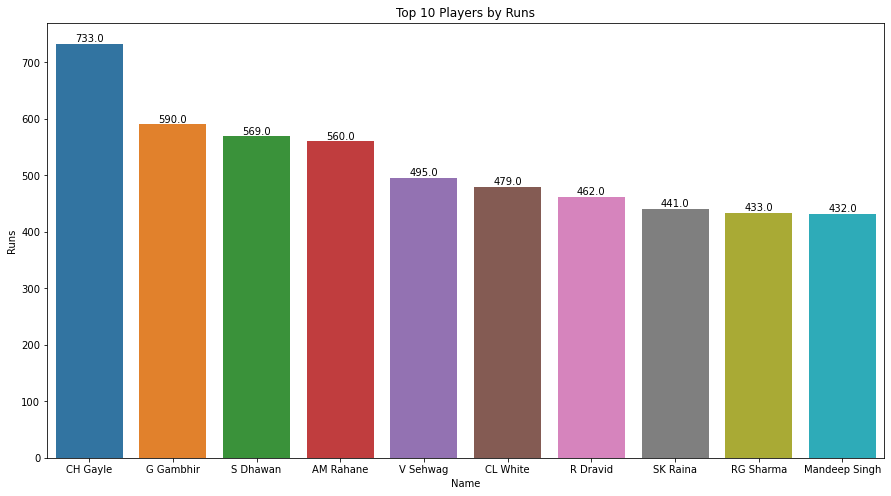

In [225]:
fig, ax = plt.subplots()
fig.set_size_inches(15,8)
b1=sport.groupby('Name')['Runs'].sum().sort_values(ascending = False ).head(10)
b1= b1.reset_index() 
b1.columns = ['Name' ,'Runs']
ax=sns.barplot(data = b1, x= 'Name' , y ='Runs'); 
plt.title("Top 10 Players by Runs");


for p in ax.patches: 
    ax.annotate(str((np.round(p.get_height()/len(b1)*10,decimals=2))), (p.get_x()+p.get_width()/2., p.get_height()), ha='center', va='center', xytext=(0, 5), textcoords='offset points')

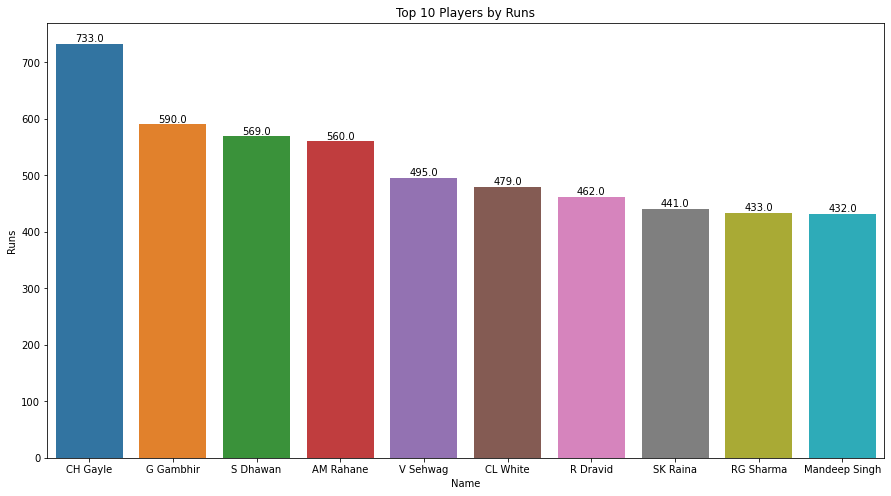

In [225]:
fig, ax = plt.subplots()
fig.set_size_inches(15,8)
b1=sport.groupby('Name')['Runs'].sum().sort_values(ascending = False ).head(10)
b1= b1.reset_index() 
b1.columns = ['Name' ,'Runs']
ax=sns.barplot(data = b1, x= 'Name' , y ='Runs'); 
plt.title("Top 10 Players by Runs");


for p in ax.patches: 
    ax.annotate(str((np.round(p.get_height()/len(b1)*10,decimals=2))), (p.get_x()+p.get_width()/2., p.get_height()), ha='center', va='center', xytext=(0, 5), textcoords='offset points')

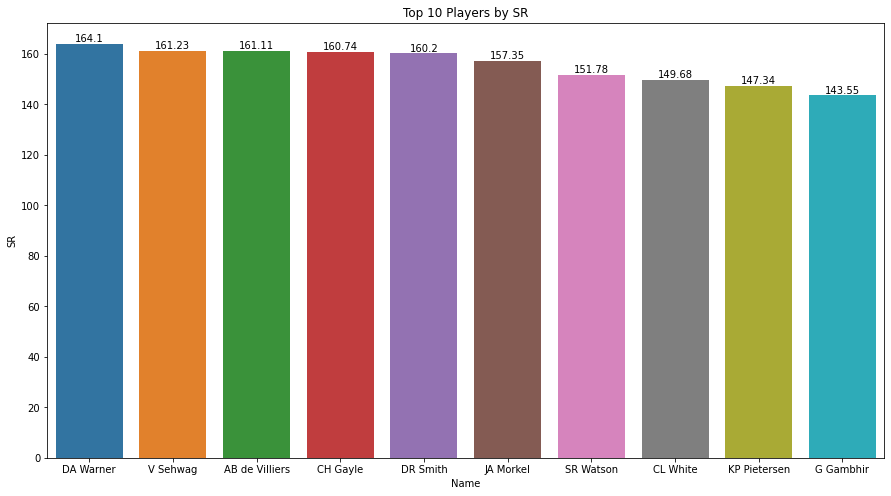

In [227]:
fig, ax = plt.subplots()
fig.set_size_inches(15,8)
b1=sport.groupby('Name')['SR'].sum().sort_values(ascending = False ).head(10)
b1= b1.reset_index() 
b1.columns = ['Name' ,'SR']
ax=sns.barplot(data = b1, x= 'Name' , y ='SR'); 
plt.title("Top 10 Players by SR");


for p in ax.patches: 
    ax.annotate(str((np.round(p.get_height()/len(b1)*10,decimals=2))), (p.get_x()+p.get_width()/2., p.get_height()), ha='center', va='center', xytext=(0, 5), textcoords='offset points')

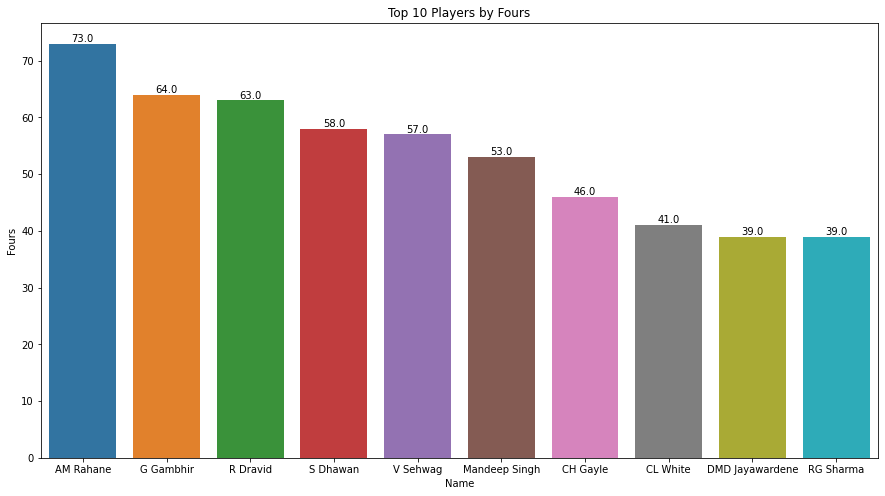

In [228]:
fig, ax = plt.subplots()
fig.set_size_inches(15,8)
b1=sport.groupby('Name')['Fours'].sum().sort_values(ascending = False ).head(10)
b1= b1.reset_index() 
b1.columns = ['Name' ,'Fours']
ax=sns.barplot(data = b1, x= 'Name' , y ='Fours'); 
plt.title("Top 10 Players by Fours");


for p in ax.patches: 
    ax.annotate(str((np.round(p.get_height()/len(b1)*10,decimals=2))), (p.get_x()+p.get_width()/2., p.get_height()), ha='center', va='center', xytext=(0, 5), textcoords='offset points')

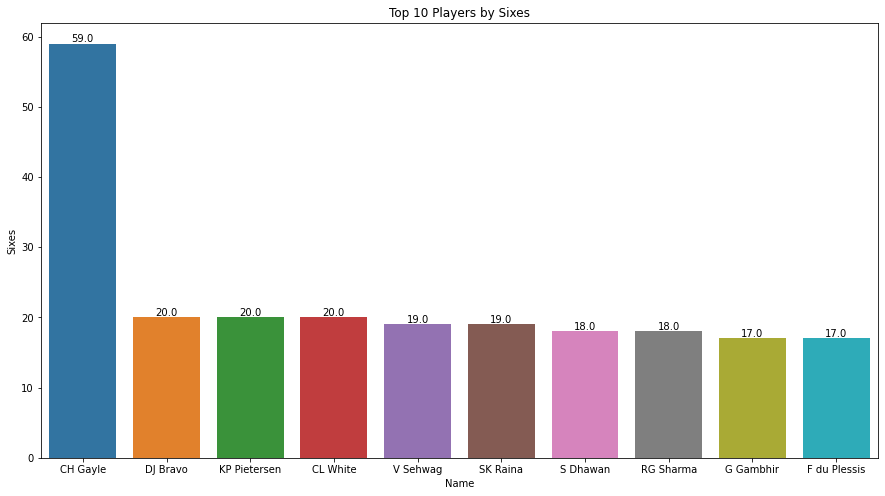

In [229]:
fig, ax = plt.subplots()
fig.set_size_inches(15,8)
b1=sport.groupby('Name')['Sixes'].sum().sort_values(ascending = False ).head(10)
b1= b1.reset_index() 
b1.columns = ['Name' ,'Sixes']
ax=sns.barplot(data = b1, x= 'Name' , y ='Sixes'); 
plt.title("Top 10 Players by Sixes");


for p in ax.patches: 
    ax.annotate(str((np.round(p.get_height()/len(b1)*10,decimals=2))), (p.get_x()+p.get_width()/2., p.get_height()), ha='center', va='center', xytext=(0, 5), textcoords='offset points')

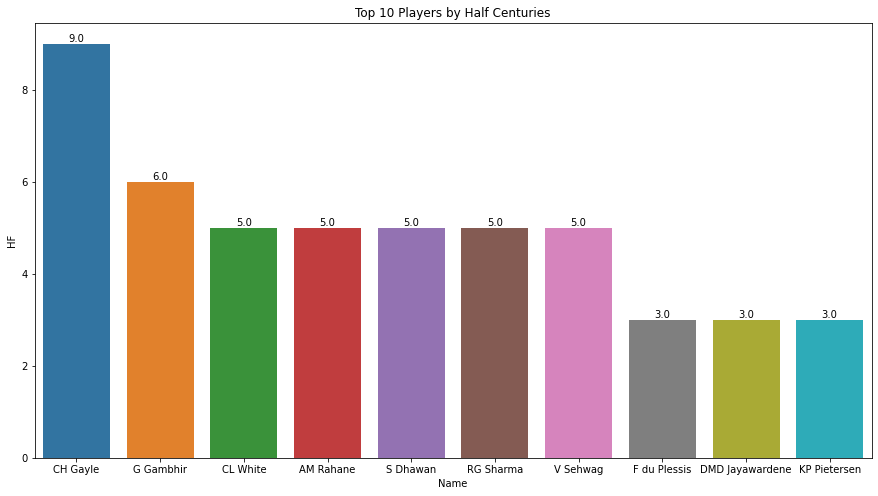

In [230]:
fig, ax = plt.subplots()
fig.set_size_inches(15,8)
b1=sport.groupby('Name')['HF'].sum().sort_values(ascending = False ).head(10)
b1= b1.reset_index() 
b1.columns = ['Name' ,'HF']
ax=sns.barplot(data = b1, x= 'Name' , y ='HF'); 
plt.title("Top 10 Players by Half Centuries");


for p in ax.patches: 
    ax.annotate(str((np.round(p.get_height()/len(b1)*10,decimals=2))), (p.get_x()+p.get_width()/2., p.get_height()), ha='center', va='center', xytext=(0, 5), textcoords='offset points')

### Implementing PCA

In [254]:
#Scalling
XS = sport.drop(['Name'], axis=1)
XSS = XS.apply(zscore)
XSS.head()

,Runs,Ave,SR,Fours,Sixes,HF
1,3.301945,2.683984,1.767325,1.607207,6.462679,4.651551
3,2.381639,0.896390,1.036605,2.710928,1.184173,2.865038
5,1.770248,0.610640,1.788154,2.281703,1.435530,2.269533
7,1.667276,1.388883,1.297182,1.300618,1.561209,2.269533
9,2.246490,1.174755,0.444038,2.343021,1.309851,2.269533


In [255]:
covMatrixs = np.cov(XSS,rowvar=False)
print(covMatrixs)
pcas = PCA(n_components=6)
pcas.fit(XSS)

[[1.01123596 0.70077082 0.49903347 0.9291323  0.77842677 0.84453142]
 [0.70077082 1.01123596 0.63061271 0.55234856 0.69008186 0.62772842]
 [0.49903347 0.63061271 1.01123596 0.38913406 0.59050396 0.43238784]
 [0.9291323  0.55234856 0.38913406 1.01123596 0.52844526 0.79249429]
 [0.77842677 0.69008186 0.59050396 0.52844526 1.01123596 0.77632221]
 [0.84453142 0.62772842 0.43238784 0.79249429 0.77632221 1.01123596]]


PCA(n_components=6)

In [256]:
print("Eigen values")
print(pcas.explained_variance_)

print()
print("Eigen vector")
print(pcas.components_)
print()
print("% of ratio")
print(pcas.explained_variance_ratio_)

Eigen values
[4.30252561 0.83636692 0.41665751 0.32912443 0.16567829 0.01706297]

Eigen vector
[[ 0.4582608   0.39797313  0.3253838   0.40574167  0.41733459  0.43237178]
 [ 0.26643209 -0.33111756 -0.69780334  0.47355804 -0.17902455  0.27593225]
 [-0.10977942  0.00550486 -0.45013448 -0.50823538  0.66942589  0.28082541]
 [-0.00520142  0.84736307 -0.43275029 -0.03252305 -0.24878157 -0.17811777]
 [ 0.45840889 -0.10122837 -0.11890348  0.09676885  0.39458014 -0.77486668]
 [ 0.70483594 -0.0606373   0.05624934 -0.58514214 -0.35786211  0.16096217]]

% of ratio
[0.70911996 0.13784566 0.06867133 0.05424458 0.02730624 0.00281223]


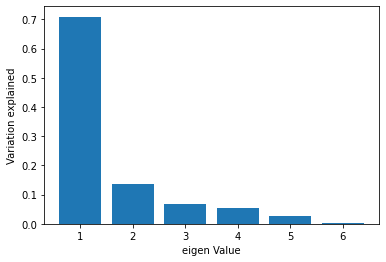

In [234]:
plt.bar(list(range(1,7)),pcas.explained_variance_ratio_,alpha=1, align='center')
plt.ylabel('Variation explained')
plt.xlabel('eigen Value')
plt.show()

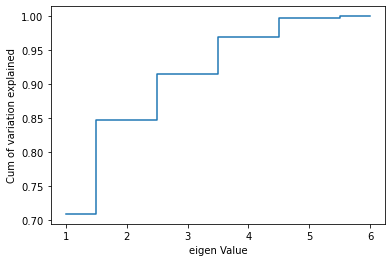

In [266]:
plt.step(list(range(1,7)),np.cumsum(pcas.explained_variance_ratio_), where='mid')
plt.ylabel('Cum of variation explained')
plt.xlabel('eigen Value')
plt.show()

### The most important feature is Runs which has 70% of the data.

In [468]:
# lets seperatet the group of top players in the data set

#checking for the within sum of squares
wss =[] 
for i in range(1,6):
    KM = KMeans(n_clusters=i)
    KM.fit(XSS)
    wss.append(KM.inertia_)
wss

[540.0000000000001,
 296.26135354732025,
 223.36518460916952,
 178.1750796759041,
 144.99062776131308]

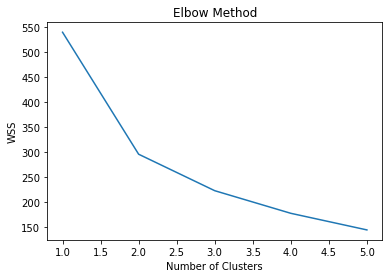

In [469]:
#plotting to check for optimal clustres 
plt.plot(range(1,6), wss);
plt.title('Elbow Method');
plt.xlabel("Number of Clusters")
plt.ylabel("WSS");

In [470]:
#using 2 centroids
k_means = KMeans(n_clusters = 2)
k_means.fit(XSS)
labels = k_means.labels_

In [473]:
# Calculating silhouette_score
silhouette_score(XSS,labels)

0.41111085574076756

In [474]:
#attaching the labels to the original data
sport['cluster']=labels
sport.head()

,Name,Runs,Ave,SR,Fours,Sixes,HF,cluster
1,CH Gayle,733.0,61.08,160.74,46.0,59.0,9.0,0
3,G Gambhir,590.0,36.87,143.55,64.0,17.0,6.0,0
5,V Sehwag,495.0,33.00,161.23,57.0,19.0,5.0,0
7,CL White,479.0,43.54,149.68,41.0,20.0,5.0,0
9,S Dhawan,569.0,40.64,129.61,58.0,18.0,5.0,0


In [477]:
#veiwing the distribution of the clusters
sport.cluster.value_counts().sort_index()

0    35
1    55
Name: cluster, dtype: int64

In [478]:
#aggregating the clusters with the numeric variables with their mean
aggdata=sport.iloc[:,0:9].groupby('cluster').mean()
aggdata['Freq']=sport.cluster.value_counts().sort_index()
aggdata

,Runs,Ave,SR,Fours,Sixes,HF,Freq
cluster,,,,,,,
0,372.657143,35.962286,132.808286,34.685714,13.771429,2.714286,35
1,122.745455,17.582000,110.481455,10.309091,3.636364,0.218182,55


In [479]:
#based on the above table renaming/ranking the playes in Grade A and Grade B
sport['cluster'] = sport['cluster'].replace({0: 'Grade A', 1: 'Grade B'})

In [500]:
#list of Grade A players
Grade_A = sport[sport['cluster'] == 'Grade A']
Grade_A

,Name,Runs,Ave,SR,Fours,Sixes,HF,cluster
1,CH Gayle,733.0,61.08,160.74,46.0,59.0,9.0,Grade A
3,G Gambhir,590.0,36.87,143.55,64.0,17.0,6.0,Grade A
5,V Sehwag,495.0,33.00,161.23,57.0,19.0,5.0,Grade A
7,CL White,479.0,43.54,149.68,41.0,20.0,5.0,Grade A
9,S Dhawan,569.0,40.64,129.61,58.0,18.0,5.0,Grade A
11,AM Rahane,560.0,40.00,129.33,73.0,10.0,5.0,Grade A
13,KP Pietersen,305.0,61.00,147.34,22.0,20.0,3.0,Grade A
15,RG Sharma,433.0,30.92,126.60,39.0,18.0,5.0,Grade A
17,AB de Villiers,319.0,39.87,161.11,26.0,15.0,3.0,Grade A
19,JP Duminy,244.0,81.33,128.42,13.0,11.0,2.0,Grade A


In [505]:
#list of Grade B players
Grade_B = sport[sport['cluster'] == 'Grade B']
Grade_B.head()

,Name,Runs,Ave,SR,Fours,Sixes,HF,cluster
69,MS Bisla,213.0,30.42,133.12,16.0,10.0,1.0,Grade B
73,BJ Hodge,245.0,30.62,140.00,18.0,9.0,0.0,Grade B
75,NV Ojha,255.0,23.18,113.83,21.0,13.0,1.0,Grade B
77,DB Das,126.0,42.00,135.48,9.0,6.0,0.0,Grade B
79,AC Gilchrist,172.0,34.40,120.27,21.0,4.0,1.0,Grade B


In [512]:
Grade_A['Rank']=Grade_A['Runs'].rank(ascending=False, method='dense')
Grade_A=Grade_A.sort_values('Rank')

In [522]:
Grade_A

,Runs,Ave,SR,Fours,Sixes,HF,cluster,Rank
Name,,,,,,,,
CH Gayle,733.0,61.08,160.74,46.0,59.0,9.0,Grade A,1.0
G Gambhir,590.0,36.87,143.55,64.0,17.0,6.0,Grade A,2.0
S Dhawan,569.0,40.64,129.61,58.0,18.0,5.0,Grade A,3.0
AM Rahane,560.0,40.00,129.33,73.0,10.0,5.0,Grade A,4.0
V Sehwag,495.0,33.00,161.23,57.0,19.0,5.0,Grade A,5.0
CL White,479.0,43.54,149.68,41.0,20.0,5.0,Grade A,6.0
R Dravid,462.0,28.87,112.13,63.0,4.0,2.0,Grade A,7.0
SK Raina,441.0,25.94,135.69,36.0,19.0,1.0,Grade A,8.0
RG Sharma,433.0,30.92,126.60,39.0,18.0,5.0,Grade A,9.0


In [523]:
Grade_B['Rank']=Grade_B['Runs'].rank(ascending=False, method='dense')
Grade_B=Grade_B.sort_values('Rank')
Grade_B.set_index('Name')

,Runs,Ave,SR,Fours,Sixes,HF,cluster,Rank
Name,,,,,,,,
BB McCullum,289.0,24.08,102.12,37.0,3.0,1.0,Grade B,1.0
SC Ganguly,268.0,17.86,98.89,30.0,4.0,0.0,Grade B,2.0
MK Tiwary,260.0,26.00,105.69,21.0,3.0,1.0,Grade B,3.0
NV Ojha,255.0,23.18,113.83,21.0,13.0,1.0,Grade B,4.0
BJ Hodge,245.0,30.62,140.00,18.0,9.0,0.0,Grade B,5.0
KD Karthik,238.0,18.30,111.73,30.0,2.0,0.0,Grade B,6.0
AL Menaria,220.0,20.00,108.91,14.0,8.0,0.0,Grade B,7.0
JEC Franklin,220.0,24.44,98.65,15.0,6.0,1.0,Grade B,7.0
MS Bisla,213.0,30.42,133.12,16.0,10.0,1.0,Grade B,8.0


## Here we seperate all the player into Grade A player and Grade B player for the sports management company to make business decisions.

## Ranking for Grade A & Grade B also given to help the company decisions on players.



_________________________________________________________________

# AIML Module Project - UNSUPERVISED LEARNING - Project 5

_________________________________________________________________


### List down all possible dimensionality reduction techniques that can be implemented using python

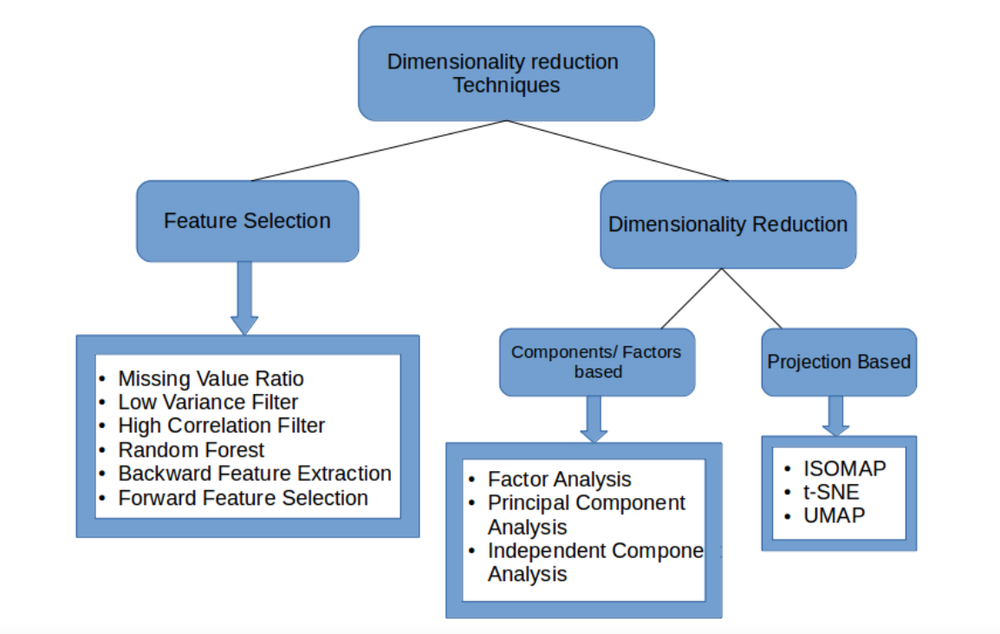

> Missing Value Ratio: If the dataset has too many missing values, we use this approach to reduce the number of variables. We    can drop the variables having a large number of missing values in them

> Low Variance filter: We apply this approach to identify and drop constant variables from the dataset. The target variable is not unduly affected by variables with low variance, and hence these variables can be safely dropped

> High Correlation filter: A pair of variables having high correlation increases multicollinearity in the dataset. So, we can use this technique to find highly correlated features and drop them accordingly

> Random Forest: This is one of the most commonly used techniques which tells us the importance of each feature present in the dataset. We can find the importance of each feature and keep the top most features, resulting in dimensionality reduction
Both Backward Feature Elimination and Forward Feature Selection techniques take a lot of computational time and are thus generally used on smaller datasets

> Factor Analysis: This technique is best suited for situations where we have highly correlated set of variables. It divides the variables based on their correlation into different groups, and represents each group with a factor

> Principal Component Analysis: This is one of the most widely used techniques for dealing with linear data. It divides the data into a set of components which try to explain as much variance as possible

> Independent Component Analysis: We can use ICA to transform the data into independent components which describe the data using less number of components

> ISOMAP: We use this technique when the data is strongly non-linear

> t-SNE: This technique also works well when the data is strongly non-linear. It works extremely well for visualizations as well

> UMAP: This technique works well for high dimensional data. Its run-time is shorter as compared to t-SNE

### So far you have used dimensional reduction on numeric data. Is it possible to do the same on a multimedia data [images and video] and text data ? Please illustrate your findings using a simple implementation on python

In [418]:
X = np.load('X.npy')
Y = np.load('Y.npy')
print("X shape",X.shape)
print("Y shape",Y.shape)

X shape (2062, 64, 64)
Y shape (2062, 10)


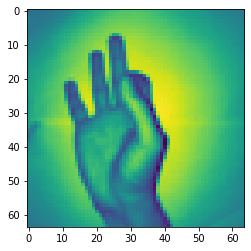

In [419]:
# Sign-language-digits-dataset is formed of 2062 images, each 64x64.
plt.imshow(X[0])

In [420]:
X_flat = np.array(X).reshape((2062, 64*64)) #flaten the image

X_train, X_test, y_train, y_test = train_test_split(X_flat, Y, test_size=0.3, random_state=42)

In [421]:
clf = MLPClassifier(solver='adam', alpha=1e-5, hidden_layer_sizes=(20, 20, 20), random_state=1)
clf.fit(X_train, y_train)

MLPClassifier(alpha=1e-05, hidden_layer_sizes=(20, 20, 20), random_state=1)

In [422]:
y_hat = clf.predict(X_test)

print("accuracy: " + str(accuracy_score(y_test, y_hat)))

accuracy: 0.3344103392568659


In [423]:
pca_dims = PCA()
pca_dims.fit(X_train)
cumsum = np.cumsum(pca_dims.explained_variance_ratio_)
d = np.argmax(cumsum >= 0.95) + 1

In [424]:
d

292

so we've gone from 4096 dimensions to just 292! But how good is this actually?

Let's train PCA on our training set and transform the data, then print out an example



In [425]:
pca = PCA(n_components=d)
X_reduced = pca.fit_transform(X_train)
X_recovered = pca.inverse_transform(X_reduced)

print("reduced shape: " + str(X_reduced.shape))
print("recovered shape: " + str(X_recovered.shape))

reduced shape: (1443, 292)
recovered shape: (1443, 4096)


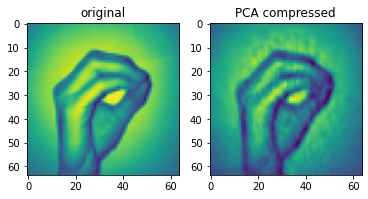

In [426]:
f = plt.figure()
f.add_subplot(1,2, 1)
plt.title("original")
plt.imshow(X_train[0].reshape((64,64)))
f.add_subplot(1,2, 2)

plt.title("PCA compressed")
plt.imshow(X_recovered[0].reshape((64,64)))
plt.show(block=True)

You can see it's far from perfect, but it's still clear what shape the hand is making

In [329]:
#doing dimensional reduction

clf_reduced = MLPClassifier(solver='adam', alpha=1e-5, hidden_layer_sizes=(20, 20, 20))
clf_reduced.fit(X_reduced, y_train)

MLPClassifier(alpha=1e-05, hidden_layer_sizes=(20, 20, 20))

In [427]:
X_test_reduced = pca.transform(X_test)

y_hat_reduced = clf_reduced.predict(X_test_reduced)

print("accuracy: " + str(accuracy_score(y_test, y_hat_reduced)))

accuracy: 0.6494345718901454


### And as you can see we've taken this simple model from ~30% accuracy on the test set to ~63%
### We can use PCA on Image data also and we have achevied increase in accuracy from without pca to with pca

## Example 2

In [444]:

#Importing the required libraries
import matplotlib.image as mpimg 

#Reading the Open Genus Logo as input
img = mpimg.imread('opengenus_logo.png')

(156, 194, 3)


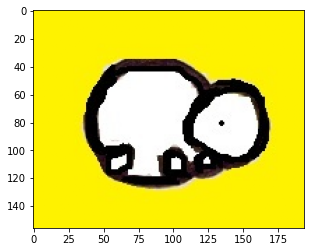

In [445]:

#Printing the shape of the image
print(img.shape) 

#Showing the image
plt.imshow(img)

In [446]:
#Our image is in the form of 156 rows each of containing pixels of the size 194*3
#194*3 = 582
img_r = np.reshape(img, (156, 582)) 
print(img_r.shape)

(156, 582)


In [447]:
M = pd.DataFrame(img_r)
M.head()

,0,1,2,3,4,5,6,7,8,9,...,572,573,574,575,576,577,578,579,580,581
0,0.996078,0.94902,0.0,0.996078,0.94902,0.0,0.996078,0.94902,0.0,0.996078,...,0.0,0.996078,0.94902,0.0,0.996078,0.94902,0.0,0.996078,0.94902,0.0
1,0.996078,0.94902,0.0,0.996078,0.94902,0.0,0.996078,0.94902,0.0,0.996078,...,0.0,0.996078,0.94902,0.0,0.996078,0.94902,0.0,0.996078,0.94902,0.0
2,0.996078,0.94902,0.0,0.996078,0.94902,0.0,0.996078,0.94902,0.0,0.996078,...,0.0,0.996078,0.94902,0.0,0.996078,0.94902,0.0,0.996078,0.94902,0.0
3,0.996078,0.94902,0.0,0.996078,0.94902,0.0,0.996078,0.94902,0.0,0.996078,...,0.0,0.996078,0.94902,0.0,0.996078,0.94902,0.0,0.996078,0.94902,0.0
4,0.996078,0.94902,0.0,0.996078,0.94902,0.0,0.996078,0.94902,0.0,0.996078,...,0.0,0.996078,0.94902,0.0,0.996078,0.94902,0.0,0.996078,0.94902,0.0


In [448]:
pca_dims = PCA()
pca_dims.fit(M)
cumsum = np.cumsum(pca_dims.explained_variance_ratio_)
dd = np.argmax(cumsum >= 0.95) + 1

In [449]:
dd

13

In [453]:
pcar = PCA(n_components=dd)
X_reducedr = pcar.fit_transform(img_r)
X_recoveredr = pcar.inverse_transform(X_reducedr)

print("reduced shape: " + str(X_reducedr.shape))
print("recovered shape: " + str(X_recoveredr.shape))

reduced shape: (156, 13)
recovered shape: (156, 582)


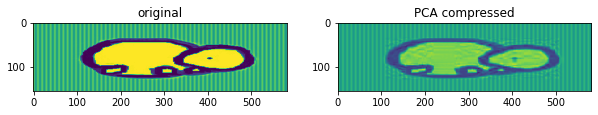

In [456]:
f = plt.figure(figsize=(10,15))
f.add_subplot(1,2, 1)
plt.title("original")
plt.imshow(img_r[:].reshape((156,582)))
f.add_subplot(1,2, 2)

plt.title("PCA compressed")
plt.imshow(X_recoveredr[:].reshape((156,582)))
plt.show(block=True)

## With PCA dimensionality reduction we can able to reduce the 158 D to 13 D and we can able to see the Original Vs PCA image at last. 